In [2]:
# tensorflow
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, Dropout, MaxPool2D, AveragePooling2D, GlobalAveragePooling2D, GlobalMaxPooling2D, Concatenate, BatchNormalization
from tensorflow.keras.models import Model

import keras

from sklearn.utils import class_weight

# others
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd

from scipy.stats import norm
from scipy.stats import spearmanr
from scipy.stats import kendalltau
from scipy.stats import rankdata


# for confusion matrix

from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# filter warning

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore', category=FutureWarning)

In [3]:
plt.style.use('ggplot')

## CNN as classifier

We are going to built a CNN to receive the remote sensing data as input and the point measurements in binary form (Rain/No rain) as output.

## Load the total dataframe:

In [4]:
# load GoogleDrive

from google.colab import drive
drive.mount('/content/gdrive', force_remount=False)  # access from Google Drive

folder = './gdrive/My Drive/Deep-Learning/'


# import the total data

df = pd.read_csv(folder+'total_3D_DataFrame.csv', index_col=1)


# rename collumn

df.rename(columns = {'Unnamed: 0': 'Type'}, inplace=True)


# index to Datetime

df.index = pd.to_datetime(df.index, errors='coerce')


# check the dataset

print(' ')
print(f'Dataset')
print(f'---' * 10)

df

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
 
Dataset
------------------------------


,Type,R[mm],0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-04-03,Initial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.315265,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,14.204300,CMORPH
1999-04-04,Initial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,14.204300,CMORPH
1999-04-05,Initial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.399024,6.997344,5.734934,2.158241,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.170425,0.370076,1.147506,1.701168,2.511150,2.291530,4.011940,8.909862,11.165271,8.982586,2.049089,0.37125,0.678333,14.204300,CMORPH
1999-04-06,Initial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.905600,1.913545,1.015484,0.000000,0.0,0.0,5.372347,21.126762,28.293043,20.623198,11.703994,9.417646,8.421867,11.710545,15.39333,16.378992,27.350716,26.338343,19.978924,16.998096,13.618281,10.29195,7.775253,6.887461,5.626505,4.370605,5.320676,6.012024,4.248294,3.569579,2.767342,1.776346,3.009688,2.629241,1.192218,0.087627,0.29000,0.000000,14.204300,CMORPH
1999-04-07,Initial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.155209,0.447093,0.382579,0.162765,0.081464,0.115988,0.079401,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,14.204300,CMORPH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,Max2,0.0,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,...,0.100000,0.700000,0.200000,0.400000,0.8,0.2,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.10000,0.100000,0.100000,0.100000,0.200000,0.400000,0.100000,0.10000,0.200000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.100000,0.10000,0.000000,11.261641,IMERG
2015-12-28,Max2,0.0,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

## Time to assess the match between the satellite-based values and the gauge observations:

## Module 1: CNN as a classifier for wet and dry days.

First we have to transform the labels to binary form, assumming a wet/dry day throshold of 1 mm/day. We will keep only the wet-season months (April to September):

### Wet season confusion matrix


               precision    recall  f1-score   support

     No Rain       0.86      0.68      0.76     99699
        Rain       0.50      0.74      0.59     42504

    accuracy                           0.70    142203
   macro avg       0.68      0.71      0.68    142203
weighted avg       0.75      0.70      0.71    142203



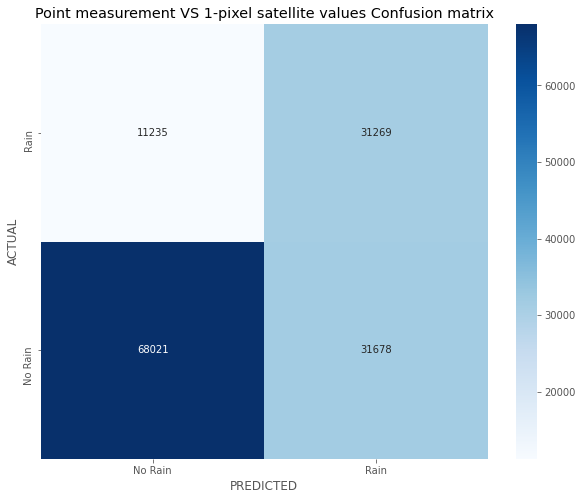

In [ ]:
ind_pixel = '560'  # index of the pixel closest to the station
thr = 1.0  # mm/day, threshold between rainy and wet days

# thr = 3.0  # FOR 3-DAY SUMS mm/day, threshold between rainy and wet days

# create a dataset for the binary variables

conf = pd.DataFrame()

# binary values

conf['gauge'] = df['Rain']
conf['gauge'][df['Rain'] == 0.0] = 'No Rain'
conf['gauge'][df['Rain'] == 1.0] = 'Rain'

conf['satellite'] = df[ind_pixel]
conf['satellite'][df[ind_pixel] < thr] = 'No Rain'
conf['satellite'][df[ind_pixel] >= thr] = 'Rain'



# confusion matrix

conf_matrix = []

labels = ['No Rain', 'Rain']

sat_binary = df

conf_matrix.append(confusion_matrix(conf['gauge'], conf['satellite']))
print('\n', classification_report(conf['gauge'], conf['satellite'], target_names=labels))

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('Point measurement VS 1-pixel satellite values Confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

# Input 16x16

We will try to turn the 32x32 input to 16x16 and see the difference in results. The first and last 8x32 collumns will be dropped, also the left and right ones. The final number of collumns has to be 16x16 = 256 collumns. 



Drop the 8 northern collumns:

In [ ]:
up = np.arange(0, 8 * 32)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

# check the updated dataset

print(f'Updated dataset')
print(f'---' * 10)

df

Updated dataset
------------------------------


,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,...,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,Rain
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.14,0.52,0.94,1.26,1.04,1.34,1.34,4.45,10.30,10.47,8.65,6.59,7.530000,8.120000,6.42,6.86,7.34,7.57,7.74,14.40,11.17,10.85,6.61,7.46,11.11,7.94,6.75,4.42,5.04,3.77,0.69,0.65,0.39,0.41,0.93,1.17,1.09,1.81,1.46,0.0
1999-05-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.000000,0.32,0.20,3.54,3.87,2.88,1.70,1.67,3.91,4.44,4.55,2.52,0.76,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
1999-05-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,1.54,0.90,0.13,0.52,0.40,0.55,0.83,8.58,6.99,9.88,10.05,12.00,12.520000,6.250000,3.38,8.61,9.61,11.54,16.28,8.89,9.84,7.95,7.12,5.31,2.92,2.84,3.39,3.78,3.02,2.34,1.53,2.76,1.78,1.46,0.49,0.00,0.58,1.16,1.24,0.0
1999-05-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.06,0.03,0.16,0.02,0.14,0.15,0.20,0.21,0.12,0.12,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
1999-05-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.07,6.45,12.94,14.56,15.78,16.790001,17.280001,11.87,9.31,8.41,9.43,8.12,4.44,0.00,0.05,0.03,0.01,0.00,0.00,0.06,0.07,0.07,0.05,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-16,62.0,53.0,52.0,55.0,53.0,58.0,62.0,62.0,58.00,56.00,55.0,53.0,54.0,50.0,48.0,52.0,52.0,51.0,48.0,38.0,48.0,51.0,36.0,37.0,40.0,52.0,47.0,32.0,35.0,30.0,30.0,28.0,60.0,58.0,53.0,51.0,56.0,64.0,60.00,57.0,...,18.00,21.00,21.00,22.00,25.00,24.00,24.00,30.00,25.00,29.00,32.00,25.00,24.000000,18.000000,30.00,26.00,28.00,26.00,24.00,31.00,30.00,27.00,27.00,31.00,32.00,30.00,27.00,27.00,22.00,22.00,25.00,25.00,27.00,24.00,19.00,21.00,24.00,21.00,20.00,1.0
2015-09-19,52.0,61.0,62.0,66.0,69.0,57.0,45.0,29.0,43.00,60.00,48.0,47.0,36.0,45.0,36.0,39.0,40.0,45.0,52.0,53.0,42.0,43.0,52.0,51.0,43.0,46.0,48.0,53.0,50.0,54.0,56.0,47.0,48.0,54.0,63.0,60.0,64.0,60.0,38.00,40.0,...,27.00,25.00,21.00,16.00,19.00,20.00,23.00,49.00,53.00,54.00,51.00,57.00,56.000000,55.000000,53.00,57.00,57.00,51.00,49.00,44.00,47.00,45.00,44.00,38.00,26.00,32.00,26.00,23.00,24.00,23.00,15.00,15.00,18.00,23.00,22.00,19.00,20.00,23.00,22.00,1.0
2015-09-22,37.0,37.0,30.0,32.0,18.0,8.0,24.0,28.0,30.00,26.00,30.0,32.0,38.0,30.0,34.0,28.0,36.0,30.0,26.0,30.0,28.0,33.0,32.0,28.0,26.0,30.0,26.0,19.0,14.0,12.0,12.0,12.0,36.0,40.0,40.0,30.0,18.0,10.0,27.00,27.0,...,13.00,10.00,10.00,9.00,10.00,12.00,10.00,22.00,24.00,29.00,36.00,32.00,32.000000,36.000000,34.00,36.00,33.00,37.00,37.00,37.00,30.00,18.00,17.00,15.0

Drop the 8 southern collumns:

In [ ]:
up = np.arange(1024 - 8 * 32, 1024)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

# check the updated dataset

print(f'Updated dataset')
print(f'---' * 10)

df

Updated dataset
------------------------------


,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,...,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,Rain
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,5.24,3.820000,7.470000,5.01,7.54,9.66,15.75,8.92,7.22,3.08,2.69,2.11,1.03,0.77,1.20,1.39,2.15,1.89,1.71,1.18,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1999-05-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.910000,0.830000,0.44,0.080000,0.000000,0.00,0.16,0.52,1.11,0.51,0.92,1.17,1.17,1.25,1.18,1.22,0.94,0.63,0.29,0.25,0.14,0.14,0.24,0.18,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1999-05-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.270000,0.190000,0.00,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1999-05-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1999-05-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.269999,26.530001,21.35,22.139999,21.529999,22.94,19.96,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-16,62.0,53.0,52.0,55.0,53.0,58.0,62.0,62.0,58.00,56.00,55.0,53.0,54.0,50.0,48.0,52.0,52.0,51.0,48.0,38.0,48.0,51.0,36.0,37.0,40.0,52.0,47.0,32.0,35.0,30.0,30.0,28.0,60.0,58.0,53.0,51.0,56.0,64.0,60.00,57.0,...,34.0,42.0,40.0,40.0,36.0,25.0,21.0,43.000000,43.000000,45.00,36.000000,36.000000,30.00,33.00,37.00,40.00,40.00,50.00,45.00,45.00,45.00,32.00,32.00,32.00,25.00,30.00,27.00,31.00,24.00,30.00,22.00,29.00,33.0,36.0,40.0,36.0,32.0,22.0,22.0,1.0
2015-09-19,52.0,61.0,62.0,66.0,69.0,57.0,45.0,29.0,43.00,60.00,48.0,47.0,36.0,45.0,36.0,39.0,40.0,45.0,52.0,53.0,42.0,43.0,52.0,51.0,43.0,46.0,48.0,53.0,50.0,54.0,56.0,47.0,48.0,54.0,63.0,60.0,64.0,60.0,38.00,40.0,...,32.0,30.0,36.0,33.0,42.0,48.0,48.0,51.000000,45.000000,45.00,52.000000,53.000000,57.00,51.00,60.00,60.00,60.00,49.00,46.00,45.00,40.00,49.00,46.00,44.00,40.00,36.00,36.00,30.00,35.00,36.00,42.00,35.00,27.0,34.0,32.0,33.0,36.0,41.0,39.0,1.0
2015-09-22,37.0,37.0,30.0,32.0,18.0,8.0,24.0,28.0,30.00,26.00,30.0,32.0,38.0,30.0,34.0,28.0,36.0,30.0,26.0,30.0,28.0,33.0,32.0,28.0,26.0,30.0,26.0,19.0,14.0,12.0,12.0,12.0,36.0,40.0,40.0,30.0,18.0,10.0,27.00,27.0,...,10.0,8.0,10.0,8.0,10.0,8.0,8.0,17.000000,19.000000,18.00,24.000000,24.000000,25.00,25.00,20.00,20.00,20.00,19.00,18.00,18.00,17.00,15.00,10.00,10.00,7.00,6.00,7.00,10.00,10.00,12.00,12.00,12.00,10.0,10.0,10.0,10.0,8.0,6.0,8.

The next step is: drop 8, keep 16, drop 8.

In [ ]:
# drop the first 8

up = np.arange(256, 264)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

# drop the last 8

up = np.arange(760, 768)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

for i in range(280, 759, 32):

  up = np.arange(i, i + 16)
  up = up.astype("str")

  print('The collumns to be dropped:', up)

  df.drop(up, axis=1, inplace=True)


# check the updated dataset

print(f'Updated dataset')
print(f'---' * 10)

df

The collumns to be dropped: ['280' '281' '282' '283' '284' '285' '286' '287' '288' '289' '290' '291'
 '292' '293' '294' '295']
The collumns to be dropped: ['312' '313' '314' '315' '316' '317' '318' '319' '320' '321' '322' '323'
 '324' '325' '326' '327']
The collumns to be dropped: ['344' '345' '346' '347' '348' '349' '350' '351' '352' '353' '354' '355'
 '356' '357' '358' '359']
The collumns to be dropped: ['376' '377' '378' '379' '380' '381' '382' '383' '384' '385' '386' '387'
 '388' '389' '390' '391']
The collumns to be dropped: ['408' '409' '410' '411' '412' '413' '414' '415' '416' '417' '418' '419'
 '420' '421' '422' '423']
The collumns to be dropped: ['440' '441' '442' '443' '444' '445' '446' '447' '448' '449' '450' '451'
 '452' '453' '454' '455']
The collumns to be dropped: ['472' '473' '474' '475' '476' '477' '478' '479' '480' '481' '482' '483'
 '484' '485' '486' '487']
The collumns to be dropped: ['504' '505' '506' '507' '508' '509' '510' '511' '512' '513' '514' '515'
 '516' '51

,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,328,329,330,331,332,333,334,335,...,689,690,691,692,693,694,695,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,Rain
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.14,0.28,0.45,0.08,0.0,0.0,0.0,3.27,3.51,4.17,2.37,1.60,0.90,0.42,0.28,0.76,0.95,0.51,0.64,0.64,0.79,0.00,0.00,15.75,8.92,7.22,3.08,2.69,2.11,1.03,0.77,1.20,1.39,2.15,1.89,1.71,1.18,0.00,0.00,0.0
1999-05-04,0.02,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.02,0.01,0.01,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.06,0.0,0.07,0.1,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.10,0.00,0.41,6.78,0.71,0.57,0.46,0.35,0.00,0.00,0.00,0.02,0.02,0.02,0.03,0.03,1.11,0.51,0.92,1.17,1.17,1.25,1.18,1.22,0.94,0.63,0.29,0.25,0.14,0.14,0.24,0.18,0.0
1999-05-07,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
1999-05-10,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
1999-05-13,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-16,58.00,56.00,55.0,53.0,54.0,50.0,48.0,52.0,52.0,51.0,48.0,38.0,48.0,51.0,36.0,37.0,53.00,53.00,52.00,50.00,47.0,54.0,52.0,54.0,52.0,50.0,50.0,38.0,47.0,44.0,42.0,37.0,53.00,51.0,55.00,53.0,56.0,56.0,54.0,50.0,...,45.00,37.00,35.00,27.00,36.0,40.0,40.0,45.00,45.00,48.00,50.00,47.00,40.00,32.00,28.00,37.00,40.00,35.00,30.00,30.00,33.00,35.00,35.00,40.00,40.00,50.00,45.00,45.00,45.00,32.00,32.00,32.00,25.00,30.00,27.00,31.00,24.00,30.00,22.00,1.0
2015-09-19,43.00,60.00,48.0,47.0,36.0,45.0,36.0,39.0,40.0,45.0,52.0,53.0,42.0,43.0,52.0,51.0,53.00,57.00,58.00,53.00,36.0,43.0,33.0,42.0,46.0,45.0,50.0,51.0,41.0,46.0,44.0,52.0,54.00,53.0,63.00,57.0,38.0,36.0,35.0,45.0,...,33.00,32.00,33.00,32.00,24.0,23.0,33.0,69.00,64.00,53.00,51.00,53.00,50.00,57.00,56.00,39.00,35.00,34.00,31.00,24.00,26.00,29.00,36.00,60.00,60.00,49.00,46.00,45.00,40.00,49.00,46.00,44.00,40.00,36.00,36.00,30.00,35.00,36.00,42.00,1.0
2015-09-22,30.00,26.00,30.0,32.0,38.0,30.0,34.0,28.0,36.0,30.0,26.0,30.0,28.0,33.0,32.0,28.0,28.00,26.00,26.00,30.00,34.0,32.0,34.0,30.0,30.0,30.0,26.0,32.0,33.0,32.0,26.0,30.0,30.00,30.0,30.00,25.0,34.0,36.0,34.0,30.0,...,7.00,7.00,6.00,5.00,6.0,7.0,8.0,10.00,12.00,19.00,10.00,11.00,11.00,10.00,6.00,8.00,7.00,6.00,7.00,6.00,5.00,8.00,8.00,20.00,20.00,19.00,18.00,18.00,17.00,15.00,10.00,10.00,7.00,6.00,7.00,10.00,10.00,12.00,12.00,1.0


### We finally have 16x16 = 256 pixel collumns left!

# Input 8x8

We will try to turn the 32x32 input to 8x8 and see the difference in the results. The first and last 12x32 collumns will be dropped, also the left and right ones. The final number of collumns has to be 8x8 = 64 collumns.

Drop the 12 northern collumns:

In [ ]:
up = np.arange(0, 12 * 32)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

# check the updated dataset

print(f'Updated dataset')
print(f'---' * 10)

df

Updated dataset
------------------------------


,R[mm],384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-04-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.07,0.07,0.09,0.13,0.13,0.14,0.21,0.19,0.19,0.21,0.23,0.30,0.30,0.36,0.41,0.56,0.47,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,14.204300,MSWEP
1999-04-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,14.204300,MSWEP
1999-04-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,14.204300,MSWEP
1999-04-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.62,4.21,4.17,4.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.40,7.02,6.78,4.30,4.37,4.35,0.0,0.0,14.204300,MSWEP
1999-04-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.61,4.93,4.74,5.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.71,3.63,2.72,3.15,5.97,5.93,8.44,8.14,7.93,5.11,5.02,5.13,0.0,0.0,14.204300,MSWEP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,11.261641,RFE
2015-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,11.261641,RFE
2015-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,11.261641,RFE


Drop the 12 southern collumns:

In [ ]:
up = np.arange(1024 - 12 * 32, 1024)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

# check the updated dataset

print(f'Updated dataset')
print(f'---' * 10)

df

Updated dataset
------------------------------


,R[mm],384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,...,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-04-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,14.204300,MSWEP
1999-04-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,14.204300,MSWEP
1999-04-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,14.204300,MSWEP
1999-04-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,14.204300,MSWEP
1999-04-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.61,0.58,0.64,0.66,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.54,0.61,0.65,0.65,0.71,0.7,0.0,0.0,14.204300,MSWEP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,11.261641,RFE
2015-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,11.261641,RFE
2015-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,11.261641,RFE


The next step is: drop 12, keep 8, drop 12

In [ ]:
# drop the first 12

up = np.arange(384, 396)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

# drop the last 12

up = np.arange(628, 640)
up = up.astype("str")

df.drop(up, axis=1, inplace=True)

for i in range(404, 622, 32):

  up = np.arange(i, i + 24)
  up = up.astype("str")

  print('The collumns to be dropped:', up)

  df.drop(up, axis=1, inplace=True)


# check the updated dataset

print(f'Updated dataset')
print(f'---' * 10)

df

The collumns to be dropped: ['404' '405' '406' '407' '408' '409' '410' '411' '412' '413' '414' '415'
 '416' '417' '418' '419' '420' '421' '422' '423' '424' '425' '426' '427']
The collumns to be dropped: ['436' '437' '438' '439' '440' '441' '442' '443' '444' '445' '446' '447'
 '448' '449' '450' '451' '452' '453' '454' '455' '456' '457' '458' '459']
The collumns to be dropped: ['468' '469' '470' '471' '472' '473' '474' '475' '476' '477' '478' '479'
 '480' '481' '482' '483' '484' '485' '486' '487' '488' '489' '490' '491']
The collumns to be dropped: ['500' '501' '502' '503' '504' '505' '506' '507' '508' '509' '510' '511'
 '512' '513' '514' '515' '516' '517' '518' '519' '520' '521' '522' '523']
The collumns to be dropped: ['532' '533' '534' '535' '536' '537' '538' '539' '540' '541' '542' '543'
 '544' '545' '546' '547' '548' '549' '550' '551' '552' '553' '554' '555']
The collumns to be dropped: ['564' '565' '566' '567' '568' '569' '570' '571' '572' '573' '574' '575'
 '576' '577' '578' '579'

,R[mm],396,397,398,399,400,401,402,403,428,429,430,431,432,433,434,435,460,461,462,463,464,465,466,467,492,493,494,495,496,497,498,499,524,525,526,527,528,529,530,531,556,557,558,559,560,561,562,563,588,589,590,591,592,593,594,595,620,621,622,623,624,625,626,627,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-04-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.204300,MSWEP
1999-04-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.204300,MSWEP
1999-04-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.204300,MSWEP
1999-04-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.204300,MSWEP
1999-04-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.204300,MSWEP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.261641,RFE
2015-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.261641,RFE
2015-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.261641,RFE


We finally have 8 x 8 = 64 collumns !

# Benchmark

We are going to use some common ML classification algorithms as benchmark models to compare the CNN classifier with.

In [ ]:
# import sklearn

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.calibration import calibration_curve
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
# training, validation and test datasets

from sklearn.model_selection import train_test_split

x = df.drop(['Rain'], axis=1)
y = df['Rain']

x_tra, x_val, y_tra, y_val = train_test_split(x, y, test_size=0.15, random_state=42)
x_tra, x_tst, y_tra, y_tst = train_test_split(x_tra, y_tra, test_size=len(x_val), random_state=42)

for name, data in zip(['Training','Validation', 'Training'], [x_tra, x_val, x_tst]):
  print(f'The {name} dataset is {len(data)} rows long.')

The Training dataset is 101660 rows long.
The Validation dataset is 21785 rows long.
The Training dataset is 21785 rows long.


In [ ]:
# import scaler
from sklearn.preprocessing import MinMaxScaler

# scale the data
scaler = MinMaxScaler([0, 1])
x_tra = scaler.fit_transform(x_tra)  # fit the scaler only at the training data
x_val = scaler.transform(x_val)
x_tst = scaler.transform(x_tst)
x = scaler.transform(x)  # all of the data

In [ ]:
x  # checking MinMaxScaler

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.10689471, 0.12787013, 0.13470805, ..., 0.        , 0.        ,
        0.        ]])

## 1. Logistic Regression model

In [ ]:
# fit LogReg model

LogReg = LogisticRegression(fit_intercept = True)  # with intercept better performance
LogReg.fit(x_tra, y_tra)

est_coefficients = [LogReg.intercept_.tolist()[0]] + LogReg.coef_.tolist()[0]

# model performance

# score is defined as: (fraction of correct predictions): correct predictions / total number of data points

# score
scTrain = LogReg.score(x_tra, y_tra)
scVal = LogReg.score(x_val, y_val)
scTest = LogReg.score(x_tst, y_tst)


# present score

print('Score')
print('--'*10)
print(f'Training: {scTrain:.3f}')
print(f'Validation: {scVal:.3f}')
print(f'Test: {scTest:.3f}')

Score
--------------------
Training: 0.748
Validation: 0.741
Test: 0.744


In [ ]:
# Compare the total rainy days 

y_mod = LogReg.predict(x)

print('The model predicted', sum(y_mod), 'rainy days.')
print(' ')
print('There were actually', sum(y), 'rainy days.')

The model predicted 510.0 rainy days.
 
There were actually 984.0 rainy days.



               precision    recall  f1-score   support

     No Rain       0.93      0.76      0.83     18557
        Rain       0.32      0.65      0.43      3228

    accuracy                           0.74     21785
   macro avg       0.62      0.71      0.63     21785
weighted avg       0.84      0.74      0.77     21785



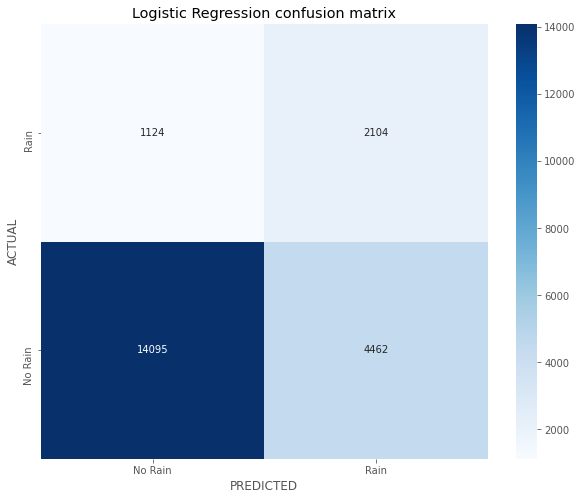

In [ ]:
# confusion matrix,training dataset

conf_matrix = []

labels = ['No Rain', 'Rain']

y_mod = LogReg.predict(x_tst)  # only the testing dataset

conf_matrix.append(confusion_matrix(y_mod, y_tst))
print('\n', classification_report(y_mod, y_tst, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('Logistic Regression confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

## 2. Gaussian Naive Bayes model

In [ ]:
# fit Gaussian Naive Bayes model

gnb = GaussianNB()
gnb.fit(x_tra ,y_tra)

# model performance

# score is defined as: (fraction of correct predictions): correct predictions / total number of data points

# score
scTrain = gnb.score(x_tra, y_tra)
scVal = gnb.score(x_val, y_val)
scTest = gnb.score(x_tst, y_tst)


# present score

print('Score')
print('--'*10)
print(f'Training: {scTrain:.3f}')
print(f'Validation: {scVal:.3f}')
print(f'Test: {scTest:.3f}')

Score
--------------------
Training: 0.733
Validation: 0.732
Test: 0.732


In [ ]:
# Compare the total rainy days 

y_mod = gnb.predict(x)

print('The model predicted', sum(y_mod), 'rainy days.')
print(' ')
print('There were actually', sum(df['Rain']), 'rainy days.')

The model predicted 1154.0 rainy days.
 
There were actually 984.0 rainy days.



               precision    recall  f1-score   support

     No Rain       0.85      0.78      0.82     16484
        Rain       0.46      0.57      0.51      5301

    accuracy                           0.73     21785
   macro avg       0.65      0.68      0.66     21785
weighted avg       0.75      0.73      0.74     21785



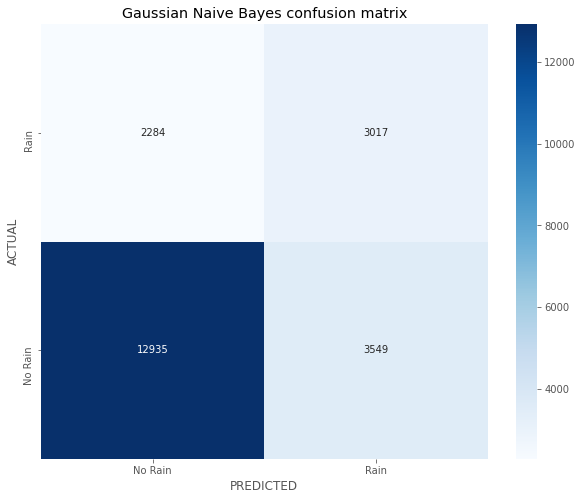

In [ ]:
# confusion matrix, training dataset

conf_matrix = []

labels = ['No Rain', 'Rain']

y_mod = gnb.predict(x_tst)  # only the testing dataset

conf_matrix.append(confusion_matrix(y_mod, y_tst))
print('\n', classification_report(y_mod, y_tst, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('Gaussian Naive Bayes confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

## 3. Random Forrest model

In [ ]:
# fit Random Forrest model

rfc = RandomForestClassifier(bootstrap = False)
rfc.fit(x_tra ,y_tra)

# model performance

# score is defined as: (fraction of correct predictions): correct predictions / total number of data points

# score
scTrain = rfc.score(x_tra, y_tra)
scVal = rfc.score(x_val, y_val)
scTest = rfc.score(x_tst, y_tst)


# present score

print('Score')
print('--'*10)
print(f'Training: {scTrain:.3f}')
print(f'Validation: {scVal:.3f}')
print(f'Test: {scTest:.3f}')

Score
--------------------
Training: 0.995
Validation: 0.750
Test: 0.758


In [ ]:
# Compare the total rainy days 

y_mod = rfc.predict(x)

print('The model predicted', sum(y_mod), 'rainy days.')
print(' ')
print('There were actually', sum(df['Rain']), 'rainy days.')

The model predicted 877.0 rainy days.
 
There were actually 984.0 rainy days.



               precision    recall  f1-score   support

     No Rain       0.88      0.79      0.84     16908
        Rain       0.47      0.63      0.54      4877

    accuracy                           0.76     21785
   macro avg       0.68      0.71      0.69     21785
weighted avg       0.79      0.76      0.77     21785



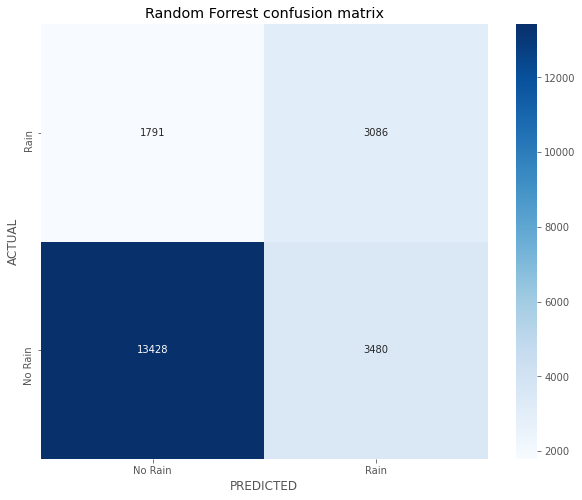

In [ ]:
# confusion matrix, training dataset

conf_matrix = []

labels = ['No Rain', 'Rain']

y_mod = rfc.predict(x_tst)  # only the testing dataset

conf_matrix.append(confusion_matrix(y_mod, y_tst))
print('\n', classification_report(y_mod, y_tst, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('Random Forrest confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

## 4. Support Vector Classification (SVC) model

In [ ]:
# fit SVC model

svc = LinearSVC(C = 1.0, fit_intercept = True)
svc.fit(x_tra ,y_tra)

# model performance

# score is defined as: (fraction of correct predictions): correct predictions / total number of data points

# score
scTrain = svc.score(x_tra, y_tra)
scVal = svc.score(x_val, y_val)
scTest = svc.score(x_tst, y_tst)


# present score

print('Score')
print('--'*10)
print(f'Training: {scTrain:.3f}')
print(f'Validation: {scVal:.3f}')
print(f'Test: {scTest:.3f}')

Score
--------------------
Training: 0.749
Validation: 0.738
Test: 0.742


In [ ]:
# Compare the total rainy days 

y_mod = svc.predict(x)

print('The model predicted', sum(y_mod), 'rainy days.')
print(' ')
print('There were actually', sum(df['Rain']), 'rainy days.')

The model predicted 561.0 rainy days.
 
There were actually 984.0 rainy days.



               precision    recall  f1-score   support

     No Rain       0.93      0.76      0.83     18681
        Rain       0.31      0.65      0.42      3104

    accuracy                           0.74     21785
   macro avg       0.62      0.71      0.63     21785
weighted avg       0.84      0.74      0.78     21785



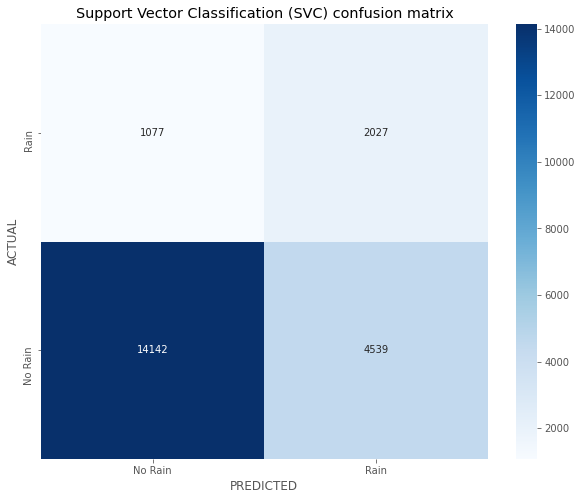

In [ ]:
# confusion matrix, training dataset

conf_matrix = []

labels = ['No Rain', 'Rain']

y_mod = svc.predict(x_tst)  # only the testing dataset

conf_matrix.append(confusion_matrix(y_mod, y_tst))
print('\n', classification_report(y_mod, y_tst, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('Support Vector Classification (SVC) confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

# Keep 3 certain datasets and stack them up

In [11]:
# keep the wet season months:

df = df[df.index.month.isin([5, 6, 7, 8, 9])]



# check the dataset

print(' ')
print(f'Dataset')
print(f'---' * 10)

df

 
Dataset
------------------------------


,Type,R[mm],0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,Initial,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.06,0.835556,0.936667,1.357778,1.896667,2.826667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.415946,0.924782,4.758157,1.849821,3.681119,10.559258,4.786865,4.732741,8.588062,3.191663,1.9125,1.396667,1.721667,1.74000,1.583333,1.778750,0.523333,14.204300,CMORPH
1999-05-02,Initial,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.860000,1.646667,2.360000,0.000000,0.000000,0.000000,0.000000,0.000000,1.721130,2.112291,2.008356,1.798926,1.371220,0.265541,0.263385,0.166101,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.085572,0.000000,0.000000,0.0000,0.000000,0.101667,0.86375,0.856667,4.900001,0.345000,14.204300,CMORPH
1999-05-03,Initial,0.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.104444,0.175000,0.111111,0.000000,0.000000,0.197584,1.189444,1.797991,0.963333,0.733818,0.741985,0.319021,0.071330,0.707538,0.440278,0.092238,0.801900,0.138513,0.0,0.000000,0.000000,0.000000,0.000000,0.280959,3.469886,0.732840,1.858236,3.408867,2.802758,1.501737,0.0000,0.076667,0.130000,0.26125,0.290000,0.086250,0.000000,14.204300,CMORPH
1999-05-04,Initial,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,1.154420,7.031876,8.675073,3.258334,1.177912,2.137939,2.262052,1.898348,1.214787,1.861515,0.688183,0.277222,0.000000,0.0,0.000000,0.080533,0.000000,0.124197,1.079369,16.032810,2.550040,0.000000,0.569309,1.009791,0.335428,0.2250,0.266667,0.268333,0.07625,0.000000,0.000000,0.000000,14.204300,CMORPH
1999-05-05,Initial,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.717376,0.303722,0.000000,0.000000,0.000000,0.219462,1.446214,1.361897,2.081999,2.517508,0.000000,0.000000,0.000000,0.0,0.111308,3.401892,2.195758,0.806999,1.045306,1.772081,0.148930,0.000000,0.000000,0.166704,0.000000,0.6100,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,14.204300,CMORPH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-26,Max2,44.40,0.1,0.6,1.4,2.5,4.2,4.4,3.0,1.6,2.6,3.7,3.9,3.7,3.6,3.2,6.7,9.0,7.0,6.1,4.5,4.5,8.8,16.5,18.2,16.8,22.9,25.1,26.8,29.6,25.4,17.9,11.3,5.9,0.2,0.6,1.2,2.4,4.2,4.6,...,33.50,31.800000,28.900000,28.600000,32.300000,38.500000,17.000000,14.200000,13.000000,12.100000,13.700000,13.900000,13.700000,14.700000,16.000000,17.100000,15.600000,13.400000,12.100000,9.9,9.500000,10.300000,16.500000,22.300000,25.800000,33.700000,41.700000,52.500000,60.700000,54.500000,48.400000,39.9000,31.100000,29.900000,29.40000,27.400000,31.500000,39.200000,11.261641,IMERG
2015-09-27,Max2,0.10,0.5,0.6,1.4,2.5,4.2,4.4,3.0,1.6,2.6,3.7,3.9,3

Keep only certain datasets:

In [12]:
# Keep only INITIAL dataset

df_initial =  df[ (df['Type'] == 'Initial') ]  


# check the dataset

print(' ')
print(f'Dataset')
print(f'---' * 10)

df_initial

 
Dataset
------------------------------


,Type,R[mm],0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,Initial,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,2.06,0.835556,0.936667,1.357778,1.896667,2.826667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.415946,0.924782,4.758157,1.849821,3.681119,10.559258,4.786865,4.732741,8.588062,3.191663,1.9125,1.396667,1.721667,1.74000,1.583333,1.778750,0.523333,14.204300,CMORPH
1999-05-02,Initial,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.860000,1.646667,2.360000,0.000000,0.000000,0.000000,0.000000,0.000000,1.721130,2.112291,2.008356,1.798926,1.371220,0.265541,0.263385,0.166101,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.085572,0.000000,0.000000,0.0000,0.000000,0.101667,0.86375,0.856667,4.900001,0.345000,14.204300,CMORPH
1999-05-03,Initial,0.35,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.00,0.104444,0.175000,0.111111,0.000000,0.000000,0.197584,1.189444,1.797991,0.963333,0.733818,0.741985,0.319021,0.071330,0.707538,0.440278,0.092238,0.801900,0.138513,0.0,0.000000,0.000000,0.000000,0.000000,0.280959,3.469886,0.732840,1.858236,3.408867,2.802758,1.501737,0.0000,0.076667,0.130000,0.26125,0.290000,0.086250,0.000000,14.204300,CMORPH
1999-05-04,Initial,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,1.154420,7.031876,8.675073,3.258334,1.177912,2.137939,2.262052,1.898348,1.214787,1.861515,0.688183,0.277222,0.000000,0.0,0.000000,0.080533,0.000000,0.124197,1.079369,16.032810,2.550040,0.000000,0.569309,1.009791,0.335428,0.2250,0.266667,0.268333,0.07625,0.000000,0.000000,0.000000,14.204300,CMORPH
1999-05-05,Initial,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.717376,0.303722,0.000000,0.000000,0.000000,0.219462,1.446214,1.361897,2.081999,2.517508,0.000000,0.000000,0.000000,0.0,0.111308,3.401892,2.195758,0.806999,1.045306,1.772081,0.148930,0.000000,0.000000,0.166704,0.000000,0.6100,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,14.204300,CMORPH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-26,Initial,0.10,16.700001,16.299999,16.299999,15.700000,15.5,14.400000,13.0,12.6,12.400000,10.2,10.0,9.1,9.400000,9.9,6.800000,9.200000,10.600000,6.700000,6.6,5.5,4.1,5.6,5.5,5.1,4.8,3.2,1.8,2.8,1.8,1.4,0.7,1.7,14.8,13.400000,14.5,15.6,13.9,13.0,...,10.20,9.900000,10.100000,9.200000,9.700000,10.100000,11.900000,12.400000,12.50

In [13]:
# create a dataframe with the average of the pixel values

# m = df_initial.drop(['R[mm]', 'latitude', 'dataset'], axis=1)  # dataframe with the pixel values only
m = df_initial[ ['559', '560', '561', '527', '528', '529', '591', '592', '593'] ].copy()  # 3x3 pixels around gauge
m = m.mean(axis=1)  # one-collumn with the mean of the 1024 pixels


# if one zero and other greater than 20.0, discard row
ind = np.where( ~( ((df_initial['R[mm]'] == 0.0) | (m == 0.00)) & (np.absolute(df_initial['R[mm]'] - m) > 20.0) )  ) # ~ to not keep these values
print(len(ind[0]))

61821


In [14]:
# discard outliers from all datasets

df_initial = df_initial.iloc[ind[0]]


# classify

thr = 1.0  # mm/day, threshold between rainy and wet days

# binary values

df_initial['Rain'] = df_initial['R[mm]']
df_initial['Rain'][df_initial['R[mm]'] < thr] = 0.0
df_initial['Rain'][df_initial['R[mm]'] >= thr] = 1.0

# we will not need the 'R[mm]' column any more

df_initial.drop(['R[mm]'], axis=1, inplace=True)

df_initial

,Type,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,latitude,dataset,Rain
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,Initial,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.835556,0.936667,1.357778,1.896667,2.826667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.415946,0.924782,4.758157,1.849821,3.681119,10.559258,4.786865,4.732741,8.588062,3.191663,1.9125,1.396667,1.721667,1.74000,1.583333,1.778750,0.523333,14.204300,CMORPH,0.0
1999-05-02,Initial,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.860000,1.646667,2.360000,0.000000,0.000000,0.000000,0.000000,0.000000,1.721130,2.112291,2.008356,1.798926,1.371220,0.265541,0.263385,0.166101,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.085572,0.000000,0.000000,0.0000,0.000000,0.101667,0.86375,0.856667,4.900001,0.345000,14.204300,CMORPH,0.0
1999-05-03,Initial,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.104444,0.175000,0.111111,0.000000,0.000000,0.197584,1.189444,1.797991,0.963333,0.733818,0.741985,0.319021,0.071330,0.707538,0.440278,0.092238,0.801900,0.138513,0.0,0.000000,0.000000,0.000000,0.000000,0.280959,3.469886,0.732840,1.858236,3.408867,2.802758,1.501737,0.0000,0.076667,0.130000,0.26125,0.290000,0.086250,0.000000,14.204300,CMORPH,0.0
1999-05-04,Initial,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.154420,7.031876,8.675073,3.258334,1.177912,2.137939,2.262052,1.898348,1.214787,1.861515,0.688183,0.277222,0.000000,0.0,0.000000,0.080533,0.000000,0.124197,1.079369,16.032810,2.550040,0.000000,0.569309,1.009791,0.335428,0.2250,0.266667,0.268333,0.07625,0.000000,0.000000,0.000000,14.204300,CMORPH,0.0
1999-05-05,Initial,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.717376,0.303722,0.000000,0.000000,0.000000,0.219462,1.446214,1.361897,2.081999,2.517508,0.000000,0.000000,0.000000,0.0,0.111308,3.401892,2.195758,0.806999,1.045306,1.772081,0.148930,0.000000,0.000000,0.166704,0.000000,0.6100,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,14.204300,CMORPH,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-26,Initial,16.700001,16.299999,16.299999,15.700000,15.5,14.400000,13.0,12.6,12.400000,10.2,10.0,9.1,9.400000,9.9,6.800000,9.200000,10.600000,6.700000,6.6,5.5,4.1,5.6,5.5,5.1,4.8,3.2,1.8,2.8,1.8,1.4,0.7,1.7,14.8,13.400000,14.5,15.6,13.9,13.0,13.0,...,9.900000,10.100000,9.200000,9.700000,10.100000,11.900000,12.400000,12.500000,12.400000,11.

Mean of 2 days dataset

In [15]:
# Keep only mean of 2 days dataset

df_mean2 =  df[ (df['Type'] == 'Mean2') ]  


# discard outliers from all datasets

df_mean2 = df_mean2.iloc[ind[0]]


# we will not need the 'R[mm]' column any more

df_mean2.drop(['R[mm]'], axis=1, inplace=True)

# check the dataset

print(' ')
print(f'Mean2 Dataset')
print(f'---' * 10)

df_mean2

 
Mean2 Dataset
------------------------------


,Type,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,Mean2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.151844,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.03,0.417778,0.468333,0.678889,0.948333,1.413333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.059596,0.106625,0.065602,0.268780,0.520360,2.532158e+00,1.045292,2.342075,5.575473,2.393432,2.366371,4.294031e+00,1.595831,9.562502e-01,0.698333,0.860833,0.870000,0.791667,0.889375,0.261667,14.204300,CMORPH
1999-05-02,Mean2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.03,0.417778,0.898333,1.502222,2.128334,1.413333,0.000000,0.000000,0.000000,0.000000,0.860565,1.056146,1.004178,0.899463,0.685610,0.132771,0.131692,0.083050,0.000000,0.000000,0.000000,0.207973,0.462391,2.379079e+00,0.924910,1.840559,5.279629,2.393432,2.409157,4.294031e+00,1.595831,9.562502e-01,0.698333,0.911667,1.301875,1.220000,3.339375,0.434167,14.204300,CMORPH
1999-05-03,Mean2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.052222,0.517500,0.878889,1.180000,0.000000,0.098792,0.594722,0.898995,0.481667,1.227474,1.427138,1.163688,0.935128,1.039379,0.352910,0.177811,0.484001,0.069256,0.000000,0.000000,0.000000,0.000000,8.881784e-16,0.140479,1.734943,0.366420,0.929118,1.747220,1.401379e+00,0.750868,0.000000e+00,0.038333,0.115833,0.562500,0.573333,2.493125,0.172500,14.204300,CMORPH
1999-05-04,Mean2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.052222,0.087500,0.055556,0.000000,0.000000,0.676002,4.110660,5.236532,2.110834,0.955865,1.439962,1.290536,0.984839,0.961162,1.150897,0.390210,0.539561,0.069256,0.000000,0.000000,0.040266,0.000000,6.209847e-02,0.680164,9.751348,1.641440,0.929118,1.989088,1.906274e+00,0.918582,1.125000e-01,0.171667,0.199167,0.168750,0.145000,0.043125,0.000000,14.204300,CMORPH
1999-05-05,Mean2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.935898,3.667799,4.337536,1.629167,0.588956,1.178701,1.854133,1.630122,1.648393,2.189512,0.344091,0.138611,0.000000,0.000000,0.055654,1.741212,1.097879,4.655980e-01,1.062337,8.902446,1.349485,0.000000,0.284655,5.882475e-01,0.167714,4.175000e-01,0.133333,0.134167,0.038125,0.000000,0.000000,0.000000,14.204300,CMORPH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-26,Mean2,0.05,0.35,0.75,1.30,2.10,2.20,1.55,0.80,1.30,1.85,2.00,2.050000,2.10,2.50,4.60,5.10,3.70,3.20,2.60,3.70,7.70,12.75,14.35,13.45,16.15,16.90,17.30,18.25,15.75,11.55,7.45,4.35,0.15,0.40,0.65,1.25,2.15,2.35,1.75,...,16.80,15.950000,14.500000,14.300000,16.150000,19.250000,9.250000,7.700000,6.850000,6.200000,6.950000,7.100000,6.

Max of 2 day pixels:

In [16]:
# Keep only max of 2 days dataset

df_max2 =  df[ (df['Type'] == 'Max2') ]


# discard outliers from all datasets

df_max2 = df_max2.iloc[ind[0]]


# we will not need the 'R[mm]' column any more

df_max2.drop(['R[mm]'], axis=1, inplace=True)


# check the dataset

print(' ')
print(f'Max2 Dataset')
print(f'---' * 10)

df_max2

 
Max2 Dataset
------------------------------


,Type,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,latitude,dataset
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1999-05-01,Max2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.303688,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.06,0.835556,0.936667,1.357778,1.896667,2.826667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.119193,0.21325,0.131203,0.415946,0.924782,4.758157,1.849821,3.681119,10.559258,4.786865,4.732741,8.588062,3.191663,1.9125,1.396667,1.721667,1.74000,1.583333,1.778750,0.523333,14.204300,CMORPH
1999-05-02,Max2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.06,0.835556,0.936667,1.646667,2.360000,2.826667,0.000000,0.000000,0.000000,0.000000,1.721130,2.112291,2.008356,1.798926,1.371220,0.265541,0.263385,0.166101,0.000000,0.00000,0.000000,0.415946,0.924782,4.758157,1.849821,3.681119,10.559258,4.786865,4.732741,8.588062,3.191663,1.9125,1.396667,1.721667,1.74000,1.583333,4.900001,0.523333,14.204300,CMORPH
1999-05-03,Max2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.104444,0.860000,1.646667,2.360000,0.000000,0.197584,1.189444,1.797991,0.963333,1.721130,2.112291,2.008356,1.798926,1.371220,0.440278,0.263385,0.801900,0.138513,0.00000,0.000000,0.000000,0.000000,0.000000,0.280959,3.469886,0.732840,1.858236,3.408867,2.802758,1.501737,0.0000,0.076667,0.130000,0.86375,0.856667,4.900001,0.345000,14.204300,CMORPH
1999-05-04,Max2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.104444,0.175000,0.111111,0.000000,0.000000,1.154420,7.031876,8.675073,3.258334,1.177912,2.137939,2.262052,1.898348,1.214787,1.861515,0.688183,0.801900,0.138513,0.00000,0.000000,0.080533,0.000000,0.124197,1.079369,16.032810,2.550040,1.858236,3.408867,2.802758,1.501737,0.2250,0.266667,0.268333,0.26125,0.290000,0.086250,0.000000,14.204300,CMORPH
1999-05-05,Max2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,1.154420,7.031876,8.675073,3.258334,1.177912,2.137939,2.262052,1.898348,2.081999,2.517508,0.688183,0.277222,0.000000,0.00000,0.111308,3.401892,2.195758,0.806999,1.079369,16.032810,2.550040,0.000000,0.569309,1.009791,0.335428,0.6100,0.266667,0.268333,0.07625,0.000000,0.000000,0.000000,14.204300,CMORPH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-26,Max2,0.1,0.6,1.4,2.5,4.2,4.4,3.0,1.6,2.6,3.7,3.9,3.700000,3.6,3.2,6.7,9.0,7.0,6.1,4.5,4.5,8.8,16.5,18.2,16.8,22.9,25.1,26.8,29.6,25.4,17.9,11.3,5.9,0.2,0.6,1.2,2.4,4.2,4.6,3.4,...,33.50,31.800000,28.900000,28.600000,32.300000,38.500000,17.000000,14.200000,13.000000,12.100000,13.700000,13.900000,13.700000,14.700000,16.000000,17.100000,15.600000,13.400000,12.100000,9.90000,9.500000,10.300000,16.500000,22.300000,25.800000,33.700000,41.700000,52.500000,60.700000,54.500000,48.400000,39.9000,31.100000,29.900000,29.40000,27.400000,31.500000,39.200000,11.261641,IMERG
2015-09-27,Max2,0.5,0.6,1.4,2.5,4.2

# Dataset transformation to be used as input for the CNN

Stack up the datasets:

In [17]:
# labels are the rainfall intermittency sequence

y = df_initial['Rain']
print(y.shape)

x_initial = df_initial.drop(['Rain', 'dataset', 'latitude', 'Type'], axis=1)
x_mean2 = df_mean2.drop(['dataset', 'latitude', 'Type'], axis=1)
x_max2 = df_max2.drop(['dataset', 'latitude', 'Type'], axis=1)
print(x_initial.shape, x_mean2.shape, x_max2.shape)




# reshape to (x, 32, 32)

pixels = 32  # insert 32 for 32 * 32, 16 for 16 * 16 etc.


x_initial = x_initial.to_numpy()
x_initial = np.reshape(x_initial, (len(x_initial), pixels, pixels))  # is the reshape correct?

x_mean2 = x_mean2.to_numpy()
x_mean2 = np.reshape(x_mean2, (len(x_mean2), pixels, pixels))

x_max2 = x_max2.to_numpy()
x_max2 = np.reshape(x_max2, (len(x_max2), pixels, pixels))

print(x_initial.shape, x_mean2.shape, x_max2.shape)




# the input has to be (x, 32, 32, 3)

x = np.zeros((len(df_initial), pixels, pixels, 3))

x[:, :, :, 0] = x_initial
x[:, :, :, 1] = x_mean2
x[:, :, :, 2] = x_max2

print(' ')
print(f'Final shape')
print(f'---' * 10)

print(x.shape)

(61821,)
(61821, 1024) (61821, 1024) (61821, 1024)
(61821, 32, 32) (61821, 32, 32) (61821, 32, 32)
 
Final shape
------------------------------
(61821, 32, 32, 3)


Save the Y dataset:

In [18]:
# save the stacked dataset

np.savetxt("Y_stacked_Mean2_Max2.csv", y)

# download the total dataframe

# files.download('Y_stacked_Mean2_Max2.csv')

# save in google drive

!cp Y_stacked_Mean2_Max2.csv "./gdrive/My Drive/Deep-Learning/"

Save the stacked up dataset:

In [ ]:
# save the stacked dataset

np.save("stacked_Mean2_Max2.npy", x)

# download the total dataframe

# files.download('stacked_Mean2_Max2.csv')

# save in google drive

!cp stacked_Mean2_Max2.npy "./gdrive/My Drive/Deep-Learning/"

# Load the stacked up dataset:

In [3]:
# load GoogleDrive

from google.colab import drive
drive.mount('/content/gdrive', force_remount=False)  # access from Google Drive

folder = './gdrive/My Drive/Deep-Learning/'


# load the stacked up dataset:

x = np.load(folder+'stacked_Mean2_Max2.npy')
y = np.loadtxt(folder+'Y_stacked_Mean2_Max2.csv')

print(' ')
print(f'Final shape')
print(f'---' * 10)

print(x.shape, y.shape)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
 
Final shape
------------------------------
(61821, 32, 32, 3) (61821,)


# Pre-processing

Wet-day ratio:

In [4]:
per = sum(y) * 100 / len(y)
print(f'The percentage of rainy days in the dataset is {per:.2f}%.')

The percentage of rainy days in the dataset is 29.79%.


### Normalization of input:

In [8]:
# maximum pixel value INITIAL
m_initial = np.max(np.max(x[:,:,:,0]))
print('maximum pixel value of all collumns:', m_initial)

# maximum pixel value MEAN2
m_mean2 = np.max(np.max(x[:,:,:,1]))
print('maximum pixel value of all collumns:', m_mean2)

# maximum pixel value MAX2
m_max2 = np.max(np.max(x[:,:,:,2]))
print('maximum pixel value of all collumns:', m_max2)

maximum pixel value of all collumns: 419.70000000000016
maximum pixel value of all collumns: 245.10000000000008
maximum pixel value of all collumns: 419.70000000000016


Normalization:

In [9]:
# scale the data for the maximum pixel value of all pixels

x[:,:,:,0] = x[:,:,:,0] / m_initial
x[:,:,:,1] = x[:,:,:,1] / m_mean2
x[:,:,:,2] = x[:,:,:,2] / m_max2

print(np.max(np.max(x[:,:,:,0])), np.max(np.max(x[:,:,:,1])), np.max(np.max(x[:,:,:,2])))

1.0 1.0 1.0


In [10]:
x[:,:,:,0]  # checking MinMaxScaler

array([[[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.0011675 ,
         0.00493507, 0.00488841],
        [0.        , 0.        , 0.        , ..., 0.00323512,
         0.0045191 , 0.00673497],
        [0.        , 0.        , 0.        , ..., 0.00377254,
         0.00423815, 0.00124692]],

       [[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.00033736, 0.        , 0.        , ..., 0.00169168,
         0.        , 0.        ],
        [0.0

### Split the datasets after normalization:

In [11]:
# training, validation and test datasets

from sklearn.model_selection import train_test_split

x_tra, x_val, y_tra, y_val = train_test_split(x, y, test_size=0.10, random_state=42)
x_tra, x_tst, y_tra, y_tst = train_test_split(x_tra, y_tra, test_size=0.20, random_state=42)

for name, data in zip(['Training','Validation', 'Training'], [x_tra, x_val, x_tst]):
  print(f'The {name} dataset is {len(data)} rows long.')

The Training dataset is 44510 rows long.
The Validation dataset is 6183 rows long.
The Training dataset is 11128 rows long.


In [12]:
print(x_tra.shape, x_val.shape, y_tra.shape, y_val.shape)

(44510, 32, 32, 3) (6183, 32, 32, 3) (44510,) (6183,)


In [17]:
# x_tra[2200, 31, 31, 1]

# Loss functions for imbalanced binary classification

We are going to test some more possible loss functions for this problem: focal-loss and weighted binary crossentropy. We import and define these loss functions here.

### 1. Focal-loss

In [ ]:
!pip install tensorflow_addons  # tensorflow_addons is not in collab by default

     |████████████████████████████████| 706kB 5.6MB/s 


In [ ]:
# import focal loss function

import tensorflow_addons as tfa
FocalLoss = tfa.losses.SigmoidFocalCrossEntropy(alpha=0.2, gamma=2.0)  # (alpha=0.2, gamma=2.0) in paper


def focal_loss_custom(alpha, gamma):  # (alpha=0.2, gamma=2.0) in paper

   def binary_focal_loss(y_true, y_pred):

      FocalLoss = tfa.losses.SigmoidFocalCrossEntropy(alpha=alpha, gamma=gamma)
      y_true_K = tf.ones_like(y_true)  # tf.ones_like instead of K.ones_like
      focal_loss = FocalLoss(y_true, y_pred)
      return focal_loss
      
   return binary_focal_loss

### 2. Weighted binary crossentropy

In [ ]:
"""
Created on Thu Feb 28 15:09:26 2019
@author: lhuang
"""


def dyn_weighted_bincrossentropy(true, pred):
    """
    Calculates weighted binary cross entropy. The weights are determined dynamically
    by the balance of each category. This weight is calculated for each batch.
    
    The weights are calculted by determining the number of 'pos' and 'neg' classes 
    in the true labels, then dividing by the number of total predictions.
    
    For example if there is 1 pos class, and 99 neg class, then the weights are 1/100 and 99/100.
    These weights can be applied so false negatives are weighted 99/100, while false postives are weighted
    1/100. This prevents the classifier from labeling everything negative and getting 99% accuracy.
    
    This can be useful for unbalanced catagories.
    """
    # get the total number of inputs
    num_pred = keras.backend.sum(keras.backend.cast(pred < 0.5, true.dtype)) + keras.backend.sum(true)
    
    # get weight of values in 'pos' category
    zero_weight =  keras.backend.sum(true)/ num_pred +  keras.backend.epsilon() 
    
    # get weight of values in 'false' category
    one_weight = keras.backend.sum(keras.backend.cast(pred < 0.5, true.dtype)) / num_pred +  keras.backend.epsilon()

    # calculate the weight vector
    weights =  (1.0 - true) * zero_weight +  true * one_weight 
    
    # calculate the binary cross entropy
    bin_crossentropy = keras.backend.binary_crossentropy(true, pred)
    
    # apply the weights
    weighted_bin_crossentropy = weights * bin_crossentropy 

    return keras.backend.mean(weighted_bin_crossentropy)


def weighted_bincrossentropy(true, pred, weight_zero = 0.70, weight_one = 1.6):  # custom weights updated by the sklearn results 
    """
    Calculates weighted binary cross entropy. The weights are fixed.
        
    This can be useful for unbalanced catagories.
    
    Adjust the weights here depending on what is required.
    
    For example if there are 10x as many positive classes as negative classes,
        if you adjust weight_zero = 1.0, weight_one = 0.1, then false positives 
        will be penalize 10 times as much as false negatives.
    """
  
    # calculate the binary cross entropy
    bin_crossentropy = keras.backend.binary_crossentropy(true, pred)
    
    # apply the weights
    weights = true * weight_one + (1. - true) * weight_zero
    weighted_bin_crossentropy = weights * bin_crossentropy 

    return keras.backend.mean(weighted_bin_crossentropy)

# Time to test different CNN architectures

## CNN classifier model

The first model reported increasing validation loss after a certain number of epochs, while keeping the validation accuracy constant. We will attempt to improve that using dropout.

In [13]:
# create model

# feature extraction

i = Input(shape=x_tra[0].shape, name='Input')

x = Conv2D(8, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_A1')(i)
x = BatchNormalization(axis=1, name='BatchNormalization_A1')(x)
x = Conv2D(8, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_A2')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_A2')(x)
x = Conv2D(8, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_A3')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_A3')(x)
x = MaxPool2D(name='MaxPool2D_A')(x)  # Max pooling performs better than Average pooling



x = Conv2D(16, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_B1')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_B1')(x)
x = Conv2D(16, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_B2')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_B2')(x)
x = Conv2D(16, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_B3')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_B3')(x)
x = MaxPool2D(name='MaxPool2D_B')(x)



x = Conv2D(32, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_C1')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_C1')(x)
x = Conv2D(32, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_C2')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_C2')(x)
x = Conv2D(32, (3, 3), strides=1, activation='relu', padding='same', data_format='channels_last', name='Convolutional_C3')(x)
x = BatchNormalization(axis=1, name='BatchNormalization_C3')(x)
x = MaxPool2D(name='MaxPool2D_C')(x)


# classifier

x = Flatten(name='Flatten')(x)  # Flatten or Globalpooling

# x = GlobalAveragePooling2D(name='GlobalPooling')(x)

x = Dropout(0.10, name='Dropout_1')(x)
x = Dense(32, activation='tanh', name='Hidden')(x)

x = Dropout(0.10, name='Dropout_2')(x)
x = Dense(1, activation='sigmoid', name='Output')(x)

model = Model(i, x, name='Classifier_CNN_from_scratch')

# model summary
print('Model summary')
print("---" * 10)
print(model.summary())

Model summary
------------------------------
Model: "Classifier_CNN_from_scratch"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input (InputLayer)           [(None, 32, 32, 3)]       0         
_________________________________________________________________
Convolutional_A1 (Conv2D)    (None, 32, 32, 8)         224       
_________________________________________________________________
BatchNormalization_A1 (Batch (None, 32, 32, 8)         128       
_________________________________________________________________
Convolutional_A2 (Conv2D)    (None, 32, 32, 8)         584       
_________________________________________________________________
BatchNormalization_A2 (Batch (None, 32, 32, 8)         128       
_________________________________________________________________
Convolutional_A3 (Conv2D)    (None, 32, 32, 8)         584       
____________________________________________________________

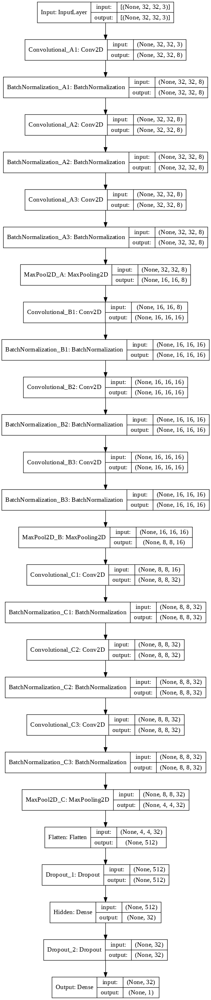

In [24]:
from tensorflow.keras.utils import plot_model

plot_model(model, show_shapes=True, dpi=92)

In [25]:
# Calculate the weights for each class so that we can balance the data
w = class_weight.compute_class_weight('balanced',
                                       np.unique(y_tra),
                                       y_tra
                                     )

weights = {0: w[0], 1: w[1]}

print('weights for 0 and 1:', w)

weights for 0 and 1: [0.71222837 1.67797633]


In [27]:
metrics = ['accuracy', 
           tf.keras.metrics.Precision(), 
           tf.keras.metrics.Recall(),
          ]

# compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='binary_crossentropy', metrics=metrics)

# fit the model and save the trajectories of loss and accuracy for training and test dataset
r_CNN = model.fit(x_tra, y_tra, verbose=1, validation_data=(x_val, y_val), epochs=30, batch_size=128)

Epoch 1/30
348/348 [==============================] - 148s 419ms/step - loss: 0.5774 - accuracy: 0.6997 - precision_1: 0.4913 - recall_1: 0.3541 - val_loss: 0.5809 - val_accuracy: 0.7183 - val_precision_1: 0.5996 - val_recall_1: 0.1711
Epoch 2/30
348/348 [==============================] - 144s 414ms/step - loss: 0.5461 - accuracy: 0.7263 - precision_1: 0.5584 - recall_1: 0.4067 - val_loss: 0.5175 - val_accuracy: 0.7438 - val_precision_1: 0.6091 - val_recall_1: 0.3974
Epoch 3/30
348/348 [==============================] - 141s 406ms/step - loss: 0.5345 - accuracy: 0.7355 - precision_1: 0.5788 - recall_1: 0.4266 - val_loss: 0.5106 - val_accuracy: 0.7490 - val_precision_1: 0.6164 - val_recall_1: 0.4228
Epoch 4/30
348/348 [==============================] - 141s 405ms/step - loss: 0.5280 - accuracy: 0.7423 - precision_1: 0.5920 - recall_1: 0.4283 - val_loss: 0.5062 - val_accuracy: 0.7538 - val_precision_1: 0.6281 - val_recall_1: 0.4315
Epoch 5/30
348/348 [==============================] - 14

KeyboardInterrupt: ignored

NameError: ignored

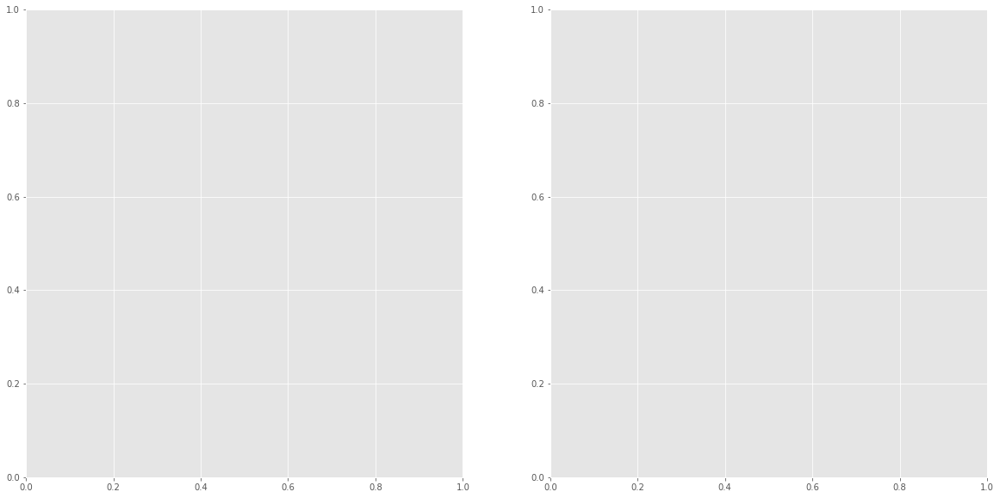

In [29]:
# plot results
f, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].plot(r_CNN.history['loss'], label = 'Loss', color = 'b')
ax[0].plot(r_CNN.history['val_loss'], label = 'validation Loss', color = 'b', ls= '--')
ax[0].legend(loc="lower left")
ax[0].set_ylim(0.0, 1.0)
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('Loss')

ax[1].plot(r_CNN.history['accuracy'], label = 'Accuracy', color = 'b')
ax[1].plot(r_CNN.history['val_accuracy'], label = 'validation Accuracy', color = 'b', ls= '--')
ax[1].legend(loc="lower left")
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_ylim(0.5, 1.0);

In [30]:
# Evaluate the model on the test data using `evaluate`

print("Evaluate on test data")
print("---" * 10)

results = model.evaluate(x_tst, y_tst, batch_size=5)

print(' ')
print("Test loss:", results[0])
print("Test accuracy:", results[1])
print("Test AUC:", results[2])
print(' ')


# Compare the total rainy days in all the datasets combined

y_mod_tra = model.predict(x_tra)>0.5
y_mod_val = model.predict(x_val)>0.5
y_mod_tst = model.predict(x_tst)>0.5
count = sum(y_mod_tra) + sum(y_mod_val) + sum(y_mod_tst)

print('Total rainy days:')
print('--' * 10)
print('The model predicted', count[0], 'rainy days.')
print('There were actually', sum(y), 'rainy days.')

Evaluate on test data
------------------------------
2226/2226 [==============================] - 22s 10ms/step - loss: 0.4798 - accuracy: 0.7688 - precision_1: 0.6513 - recall_1: 0.4778
 
Test loss: 0.47976645827293396
Test accuracy: 0.7687814235687256
Test AUC: 0.6512778401374817
 
Total rainy days:
--------------------
The model predicted 13818 rainy days.


NameError: ignored


               precision    recall  f1-score   support

     No Rain       0.80      0.89      0.84      7821
        Rain       0.65      0.48      0.55      3307

    accuracy                           0.77     11128
   macro avg       0.73      0.68      0.70     11128
weighted avg       0.76      0.77      0.76     11128



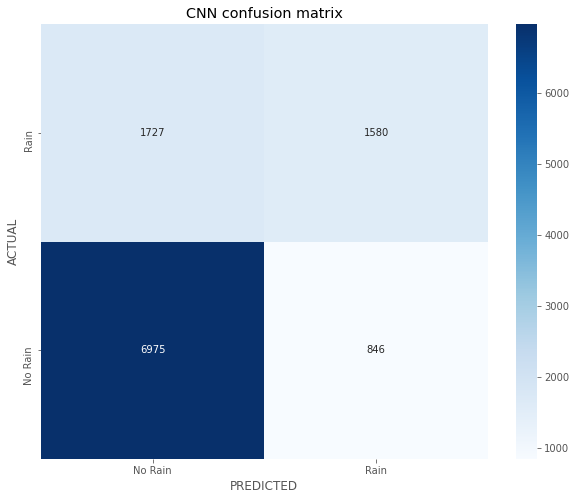

In [31]:
# confusion matrix, training dataset

conf_matrix = []

# Precision quantifies the number of positive class predictions that actually belong to the positive class.
# Recall quantifies the number of positive class predictions made out of all positive examples in the dataset.
# F-Measure provides a single score that balances both the concerns of precision and recall in one number.

labels = ['No Rain', 'Rain']

y_mod = model.predict(x_tst)>0.5  # only the testing dataset

conf_matrix.append(confusion_matrix(y_tst, y_mod))
print('\n', classification_report(y_tst, y_mod, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('CNN confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

Let's see the missclassified images:

In [5]:
# get index of misclassified images
y_mod = model.predict(x_tst)
miss_index = [i for i, y in enumerate(y_tst) if y != (y_mod[i][0] > thr_mod)]

NameError: ignored

In [ ]:
# visual inspection

print('Number of missclassified days:', len(miss_index), 'out of', len(y_tst))
print(' ')

for i in range(len(miss_index)):

  ix = miss_index[i]

  print(ix, y_tst[ix], y_mod[ix], y_mod[ix][0]>thr_mod)

In [ ]:
per = np.sum((y_mod[ miss_index ] >= 0.3) & (y_mod[ miss_index ] <= 0.7)) / len(miss_index) * 100
print('The boarderline (between 0.3 and 0.7) missclassified days are', np.sum((y_mod[ miss_index ] >= 0.3) & (y_mod[ miss_index ] <= 0.7)), 'out of', len(miss_index), 'i.e.', per, '%.')

In [ ]:
# select random image
ix = miss_index[random.randint(0, len(miss_index))]
img = x_tst[ix, :, :, 0] * m
station = locations.index[ locations[ 'station_latitude(dec.degree)' ] == x_tst_latitude[ix] ][0]

# plot image
plt.figure(figsize=(12, 10))
plt.imshow(img, cmap='Blues', label='pixel values')
plt.plot(pixels/2, pixels/2, 'ro', label=f'Gauge at {station}')
plt.colorbar()  # boundaries=np.linspace(0, 100, 6))
plt.legend()
plt.title(f'Station {station} on {x_tst_index[ix].date()}: LABEL={y_tst[ix]} | Modeled CMORPH output={y_mod[ix][0]:.2f}');

# Fine-tuning state-of-art models as classifiers

First we need to resize the images to 224 x 224

In [14]:
x_tra[4, :, :, 0].shape

(32, 32)

In [ ]:
# keras resizing to (224, 224)

from tensorflow.keras.layers.experimental import preprocessing

layer = preprocessing.Resizing(224, 224, interpolation="bilinear")
layer.adapt(x_tra)
x_tra = layer(x_tra)

print(x_tra[4, :, :, 0].shape)









# # import the interpolation function

# import scipy.interpolate as inter

# # reshape input to 224 x 224

# new_tra = np.zeros((len(x_tra), 224, 224))
# new_val = np.zeros((len(x_val), 224, 224))
# new_tst = np.zeros((len(x_tst), 224, 224))



# # FOR 32x32
# # resize training dataset
# for i in range(len(x_tra)):
#   a = x_tra[i, :, :, 0]  # 32 x 32
#   vals = np.reshape(a, (1024))
#   pts = np.array([[i,j] for i in np.linspace(0, 1, 32) for j in np.linspace(0, 1, 32)] )
#   grid_x, grid_y = np.mgrid[0:1:224j, 0:1:224j]
#   new_tra[i] = inter.griddata(pts, vals, (grid_x, grid_y), method='linear')

# # resize validation dataset
# for i in range(len(x_val)):
#   a = x_val[i, :, :, 0]  # 32 x 32
#   vals = np.reshape(a, (1024))
#   pts = np.array([[i,j] for i in np.linspace(0, 1, 32) for j in np.linspace(0, 1, 32)] )
#   grid_x, grid_y = np.mgrid[0:1:224j, 0:1:224j]
#   new_val[i] = inter.griddata(pts, vals, (grid_x, grid_y), method='linear')

# # resize test dataset
# for i in range(len(x_tst)):
#   a = x_tst[i, :, :, 0]  # 32 x 32
#   vals = np.reshape(a, (1024))
#   pts = np.array([[i,j] for i in np.linspace(0, 1, 32) for j in np.linspace(0, 1, 32)] )
#   grid_x, grid_y = np.mgrid[0:1:224j, 0:1:224j]
#   new_tst[i] = inter.griddata(pts, vals, (grid_x, grid_y), method='linear')





# # FOR 16x16 
# # resize training dataset
# for i in range(len(x_tra)):
#   a = x_tra[i, :, :, 0]  # 16 x 16
#   vals = np.reshape(a, (256))
#   pts = np.array([[i,j] for i in np.linspace(0, 1, 16) for j in np.linspace(0, 1, 16)] )
#   grid_x, grid_y = np.mgrid[0:1:224j, 0:1:224j]
#   new_tra[i] = inter.griddata(pts, vals, (grid_x, grid_y), method='linear')

# # resize validation dataset
# for i in range(len(x_val)):
#   a = x_val[i, :, :, 0]  # 16 x 16
#   vals = np.reshape(a, (256))
#   pts = np.array([[i,j] for i in np.linspace(0, 1, 16) for j in np.linspace(0, 1, 16)] )
#   grid_x, grid_y = np.mgrid[0:1:224j, 0:1:224j]
#   new_val[i] = inter.griddata(pts, vals, (grid_x, grid_y), method='linear')

# # resize test dataset
# for i in range(len(x_tst)):
#   a = x_tst[i, :, :, 0]  # 16 x 16
#   vals = np.reshape(a, (256))
#   pts = np.array([[i,j] for i in np.linspace(0, 1, 16) for j in np.linspace(0, 1, 16)] )
#   grid_x, grid_y = np.mgrid[0:1:224j, 0:1:224j]
#   new_tst[i] = inter.griddata(pts, vals, (grid_x, grid_y), method='linear')

In [ ]:
# new datasets, visual inspection suggested

# x_tra = new_tra
# x_val = new_val
# x_tst = new_tst

In [ ]:
new_tra = x_tra
new_val = x_val
new_tst = x_tst


# the input has to be (None, 224, 224, 3)

x_tra = np.zeros((len(x_tra), 224, 224, 3))
x_val = np.zeros((len(x_val), 224, 224, 3))
x_tst = np.zeros((len(x_tst), 224, 224, 3))

# repeat the same (224, 224) matrix three times

x_tra[:, :, :, 0] = new_tra
x_tra[:, :, :, 1] = new_tra
x_tra[:, :, :, 2] = new_tra

x_val[:, :, :, 0] = new_val
x_val[:, :, :, 1] = new_val
x_val[:, :, :, 2] = new_val

x_tst[:, :, :, 0] = new_tst
x_tst[:, :, :, 1] = new_tst
x_tst[:, :, :, 2] = new_tst

NameError: ignored

In [ ]:
x_tra[4, :, :].shape

(224, 224, 3)

In [ ]:
# visual inspection

x_tra[6, 6, 6, 2]

0.0

### 1. MobileNetV2

In [ ]:
MobileNet = tf.keras.applications.MobileNetV2(
                                              input_shape=(224, 224, 3),
                                              alpha=1.0,
                                              include_top=True,
                                              weights="imagenet",
                                              input_tensor=None,
                                              pooling=None,
                                              classes=1000,
                                              classifier_activation="softmax"
                                              )

In [ ]:
print('MobileNet summary')
print('--' * 10)
MobileNet.summary()

MobileNet summary
--------------------
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
________________________________________

In [ ]:
print('MobileNet type')
print('--' * 10)
type(MobileNet)

MobileNet type
--------------------


tensorflow.python.keras.engine.functional.Functional

In [ ]:
# Fine-tune MobileNet for binary classification

x = MobileNet.layers[-2].output

# binary classifier
x = Dropout(0.45, name='Dropout_1')(x)
x = Dense(64, activation='tanh', name='Hidden')(x)
x = Dropout(0.45, name='Dropout_2')(x)

predictions = Dense(1, activation='sigmoid', name='Output')(x)  # classifier

# model
model = Model(MobileNet.inputs, predictions, name='Fine-tuned_MobileNet')

# model summary
print('Fine-tuned MobileNet summary')
print('--' * 10)
model.summary()

Fine-tuned MobileNet summary
--------------------
Model: "Fine-tuned_MobileNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
_____________________________

In [ ]:
# freeze the trainable parameters of the feature extraction part

for layer in model.layers[:-4]:  # do not include the new classifier
  layer.trainable = False  # keep the weights and biases of MobileNet feature extraction
  print(layer.name)  # visual inspection of non-trainable layers

input_1
Conv1
bn_Conv1
Conv1_relu
expanded_conv_depthwise
expanded_conv_depthwise_BN
expanded_conv_depthwise_relu
expanded_conv_project
expanded_conv_project_BN
block_1_expand
block_1_expand_BN
block_1_expand_relu
block_1_pad
block_1_depthwise
block_1_depthwise_BN
block_1_depthwise_relu
block_1_project
block_1_project_BN
block_2_expand
block_2_expand_BN
block_2_expand_relu
block_2_depthwise
block_2_depthwise_BN
block_2_depthwise_relu
block_2_project
block_2_project_BN
block_2_add
block_3_expand
block_3_expand_BN
block_3_expand_relu
block_3_pad
block_3_depthwise
block_3_depthwise_BN
block_3_depthwise_relu
block_3_project
block_3_project_BN
block_4_expand
block_4_expand_BN
block_4_expand_relu
block_4_depthwise
block_4_depthwise_BN
block_4_depthwise_relu
block_4_project
block_4_project_BN
block_4_add
block_5_expand
block_5_expand_BN
block_5_expand_relu
block_5_depthwise
block_5_depthwise_BN
block_5_depthwise_relu
block_5_project
block_5_project_BN
block_5_add
block_6_expand
block_6_expand

We already changed the input from (32, 32) (OR 16x16) to (224, 224). What we need to do next is to change the classifier of the ANN from multiclass-classification to binary classification. We are going to keep the pretrained weights of the ANN constant for the rest of the layers.





In [ ]:
print('Fine-tuned MobileNet summary')  # check trainable parameters
print('--' * 10)
model.summary()

Fine-tuned MobileNet summary
--------------------
Model: "Fine-tuned_MobileNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
_____________________________

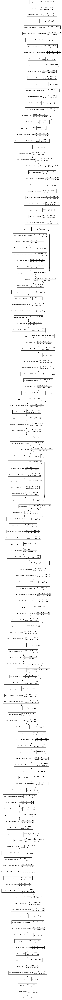

In [ ]:
plot_model(model, show_shapes=True, dpi=92)

In [ ]:
# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'AUC'])

# fit the model and save the trajectories of loss and accuracy for training and test dataset
r = model.fit(x_tra, y_tra, verbose = 1, validation_data=(x_val, y_val), epochs=15)

NameError: ignored

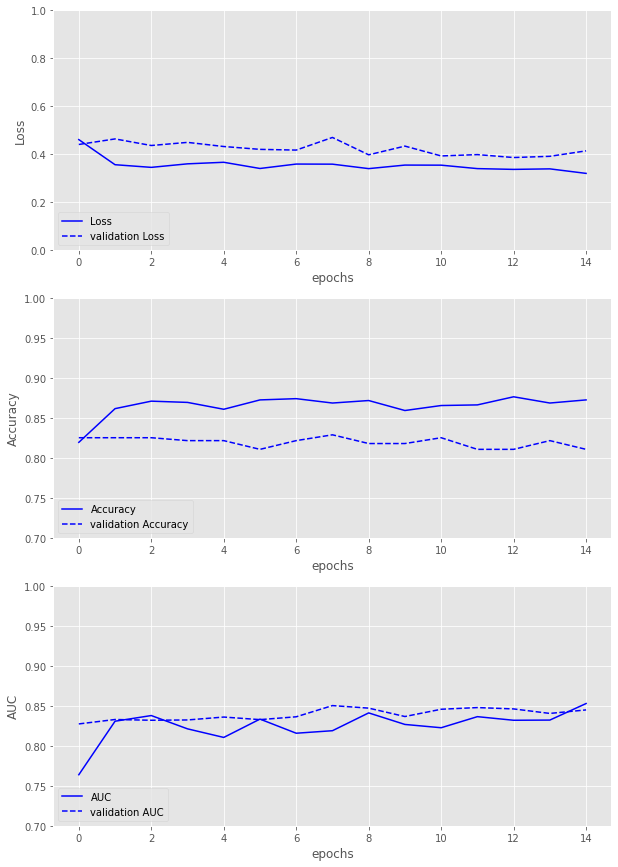

In [ ]:
# plot results
f, ax = plt.subplots(3, 1, figsize=(10, 15))

ax[0].plot(r.history['loss'], label = 'Loss', color = 'b')
ax[0].plot(r.history['val_loss'], label = 'validation Loss', color = 'b', ls= '--')
ax[0].legend(loc="lower left")
ax[0].set_ylim(0.0, 1.0)
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('Loss')

ax[1].plot(r.history['accuracy'], label = 'Accuracy', color = 'b')
ax[1].plot(r.history['val_accuracy'], label = 'validation Accuracy', color = 'b', ls= '--')
ax[1].legend(loc="lower left")
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_ylim(0.7, 1.0)

ax[2].plot(r.history['auc'], label = 'AUC', color = 'b')
ax[2].plot(r.history['val_auc'], label = 'validation AUC', color = 'b', ls= '--')
ax[2].legend(loc="lower left")
ax[2].set_xlabel('epochs')
ax[2].set_ylabel('AUC')
ax[2].set_ylim(0.7, 1.0);

In [ ]:
# Evaluate the model on the test data using `evaluate`

print("Evaluate on test data")
print("---" * 10)

results = model.evaluate(x_tst, y_tst, batch_size=5)

print(' ')
print("Test loss:", results[0])
print("Test accuracy:", results[1])
print("Test AUC:", results[2])
print(' ')


# Compare the total rainy days in all the datasets combined

y_mod_tra = model.predict(x_tra)>0.5
y_mod_val = model.predict(x_val)>0.5
y_mod_tst = model.predict(x_tst)>0.5
count = sum(y_mod_tra) + sum(y_mod_val) + sum(y_mod_tst)

print('Total rainy days:')
print('--' * 10)
print('The model predicted', count[0], 'rainy days.')
print('There were actually', sum(df['Rain']), 'rainy days.')

Evaluate on test data
------------------------------
55/55 [==============================] - 15s 237ms/step - loss: 0.3166 - accuracy: 0.8655 - auc: 0.8895
 
Test loss: 0.3165574371814728
Test accuracy: 0.8654545545578003
Test AUC: 0.8894548416137695
 
Total rainy days:
--------------------
The model predicted 264 rainy days.
There were actually 328.0 rainy days.



               precision    recall  f1-score   support

     No Rain       0.93      0.91      0.92       230
        Rain       0.58      0.62      0.60        45

    accuracy                           0.87       275
   macro avg       0.75      0.77      0.76       275
weighted avg       0.87      0.87      0.87       275



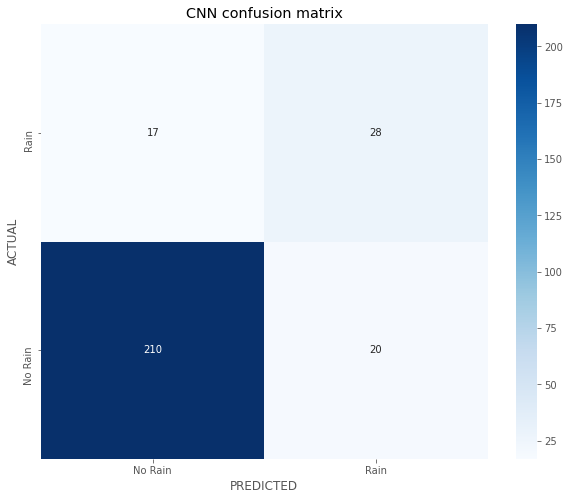

In [ ]:
# confusion matrix, training dataset

conf_matrix = []

labels = ['No Rain', 'Rain']

y_mod = model.predict(x_tst)>0.5  # only the testing dataset

conf_matrix.append(confusion_matrix(y_mod, y_tst))
print('\n', classification_report(y_mod, y_tst, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('CNN confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

## 2. ResNet50

In [ ]:
ResNet = tf.keras.applications.ResNet50(
                                          input_shape=(224, 224, 3),
                                          include_top=False,  # without classifier
                                          weights="imagenet",
                                          # input_tensor=None,
                                          # pooling=None,
                                          # classes=1000,
                                          # classifier_activation="softmax"
                                          )

94773248/94765736 [==============================] - 1s 0us/step


In [ ]:
print('ResNet summary')
print('--' * 10)
ResNet.summary()

ResNet summary
--------------------
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_______________________________________________________

In [ ]:
print('ResNet type')
print('--' * 10)
type(ResNet)

ResNet type
--------------------


tensorflow.python.keras.engine.functional.Functional

In [ ]:
# freeze the trainable parameters

ResNet.trainable = False

In [ ]:
# check trainable parameters

print('ResNet summary')
print('--' * 10)
ResNet.summary()

ResNet summary
--------------------
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_______________________________________________________

In [ ]:
# Fine-tune ResNet for binary classification

x = ResNet.output

# binary classifier
x = GlobalAveragePooling2D()(x)
x = Dropout(0.45, name='Dropout_1')(x)
x = Dense(64, activation='tanh', name='Hidden')(x)
x = Dropout(0.45, name='Dropout_2')(x)

predictions = Dense(1, activation='sigmoid', name='Output')(x)  # classifier

# model
model = Model(ResNet.inputs, predictions)


# summary

print('Fine-tuned ResNet summary')
print('--' * 10)
model.summary()

Fine-tuned ResNet summary
--------------------
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_____________________________________________

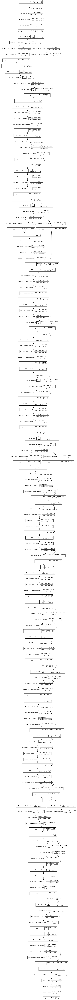

In [ ]:
  plot_model(model, show_shapes=True, dpi=92)

In [ ]:
# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'AUC'])

# fit the model and save the trajectories of loss and accuracy for training and test dataset
r = model.fit(x_tra, y_tra, verbose = 1, validation_data=(x_val, y_val), epochs=15)

Epoch 1/15
41/41 [==============================] - 242s 6s/step - loss: 0.6394 - accuracy: 0.7115 - auc: 0.5103 - val_loss: 0.5424 - val_accuracy: 0.8000 - val_auc: 0.5000
Epoch 2/15
41/41 [==============================] - 235s 6s/step - loss: 0.5578 - accuracy: 0.8010 - auc: 0.4705 - val_loss: 0.5164 - val_accuracy: 0.8000 - val_auc: 0.5068
Epoch 3/15
41/41 [==============================] - 239s 6s/step - loss: 0.5395 - accuracy: 0.7977 - auc: 0.4897 - val_loss: 0.5091 - val_accuracy: 0.8000 - val_auc: 0.5523
Epoch 4/15
41/41 [==============================] - 233s 6s/step - loss: 0.5811 - accuracy: 0.7927 - auc: 0.4237 - val_loss: 0.4998 - val_accuracy: 0.8000 - val_auc: 0.6205
Epoch 5/15
41/41 [==============================] - 233s 6s/step - loss: 0.5363 - accuracy: 0.7840 - auc: 0.5147 - val_loss: 0.6724 - val_accuracy: 0.8000 - val_auc: 0.5000
Epoch 6/15
41/41 [==============================] - 233s 6s/step - loss: 0.5486 - accuracy: 0.8045 - auc: 0.4767 - val_loss: 0.5328 - v

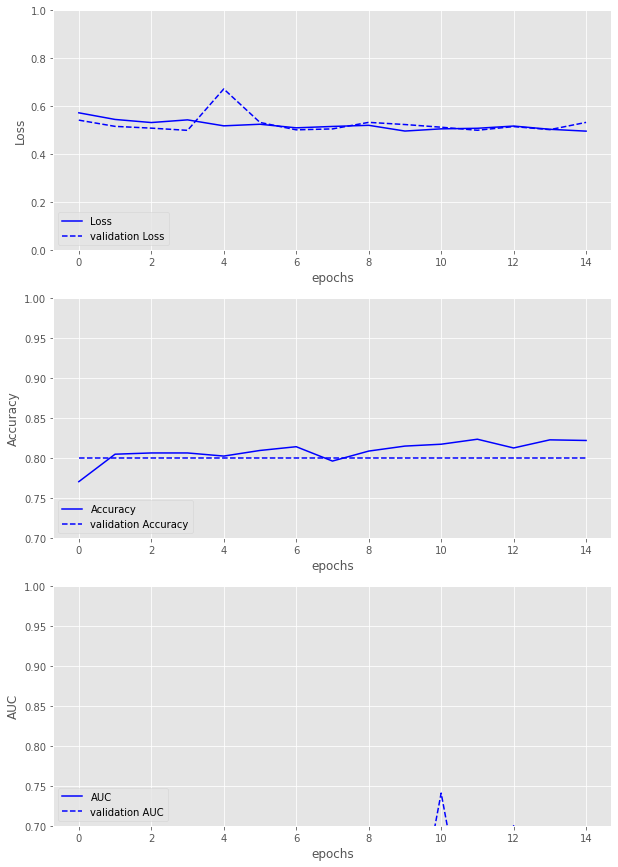

In [ ]:
# plot results
f, ax = plt.subplots(3, 1, figsize=(10, 15))

ax[0].plot(r.history['loss'], label = 'Loss', color = 'b')
ax[0].plot(r.history['val_loss'], label = 'validation Loss', color = 'b', ls= '--')
ax[0].legend(loc="lower left")
ax[0].set_ylim(0.0, 1.0)
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('Loss')

ax[1].plot(r.history['accuracy'], label = 'Accuracy', color = 'b')
ax[1].plot(r.history['val_accuracy'], label = 'validation Accuracy', color = 'b', ls= '--')
ax[1].legend(loc="lower left")
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_ylim(0.7, 1.0)

ax[2].plot(r.history['auc'], label = 'AUC', color = 'b')
ax[2].plot(r.history['val_auc'], label = 'validation AUC', color = 'b', ls= '--')
ax[2].legend(loc="lower left")
ax[2].set_xlabel('epochs')
ax[2].set_ylabel('AUC')
ax[2].set_ylim(0.7, 1.0);

In [ ]:
# Evaluate the model on the test data using `evaluate`

print("Evaluate on test data")
print("---" * 10)

results = model.evaluate(x_tst, y_tst, batch_size=5)

print(' ')
print("Test loss:", results[0])
print("Test accuracy:", results[1])
print("Test AUC:", results[2])
print(' ')


# Compare the total rainy days in all the datasets combined

y_mod_tra = model.predict(x_tra)>0.5
y_mod_val = model.predict(x_val)>0.5
y_mod_tst = model.predict(x_tst)>0.5
count = sum(y_mod_tra) + sum(y_mod_val) + sum(y_mod_tst)

print('Total rainy days:')
print('--' * 10)
print('The model predicted', count[0], 'rainy days.')
print('There were actually', sum(df['Rain']), 'rainy days.')

Evaluate on test data
------------------------------
 2/55 [>.............................] - ETA: 44s - loss: 0.1176 - accuracy: 1.0000 - auc: 0.0000e+00 


               precision    recall  f1-score   support

     No Rain       1.00      0.83      0.90       275
        Rain       0.00      0.00      0.00         0

    accuracy                           0.83       275
   macro avg       0.50      0.41      0.45       275
weighted avg       1.00      0.83      0.90       275



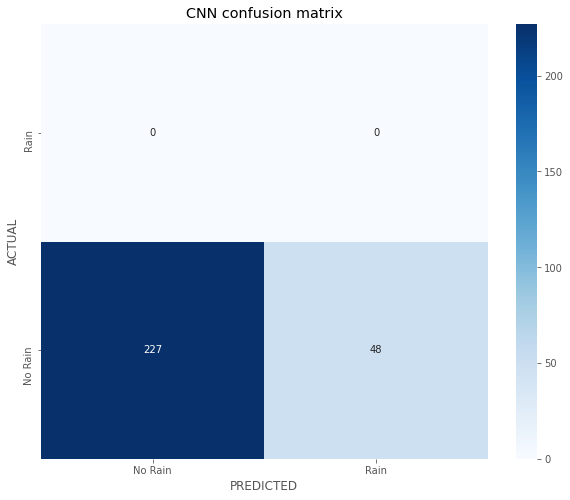

In [ ]:
# confusion matrix, training dataset

conf_matrix = []

labels = ['No Rain', 'Rain']

y_mod = model.predict(x_tst)>0.5  # only the testing dataset

conf_matrix.append(confusion_matrix(y_mod, y_tst))
print('\n', classification_report(y_mod, y_tst, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('CNN confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

## 3. InceptionV3

In [ ]:
Inception = tf.keras.applications.InceptionV3(
                                              include_top=False,  # do not load classifier
                                              weights="imagenet",
                                              input_tensor=None,
                                          #     input_shape=None,
                                          #     pooling=None,
                                          #     classes=1000,
                                          #     classifier_activation="softmax",
                                          )

87916544/87910968 [==============================] - 2s 0us/step


In [ ]:
print('Inception summary')
print('--' * 10)
Inception.summary()

Inception summary
--------------------
Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
________________________________________________

In [ ]:
print('Inception type')
print('--' * 10)
type(Inception)

Inception type
--------------------


tensorflow.python.keras.engine.functional.Functional

In [ ]:
Inception.trainable = False  # freeze the trained weights

In [ ]:
# check the frozen weights

print('Inception summary')
print('--' * 10)
Inception.summary()

Inception summary
--------------------
Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
________________________________________________

In [ ]:
# Fine-tune ResNet for binary classification

x = Inception.output

# binary classifier
x = GlobalAveragePooling2D()(x)
x = Dropout(0.45, name='Dropout_1')(x)
x = Dense(64, activation='tanh', name='Hidden')(x)
x = Dropout(0.45, name='Dropout_2')(x)

predictions = Dense(1, activation='sigmoid', name='Output')(x)  # classifier

# model
model = Model(Inception.inputs, predictions)


# summary

print('Fine-tuned Inception summary')
print('--' * 10)
model.summary()

Fine-tuned Inception summary
--------------------
Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
__________________________________________

In [ ]:
plot_model(model, show_shapes=True, dpi=92)

In [ ]:
# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'AUC'])

# fit the model and save the trajectories of loss and accuracy for training and test dataset
r = model.fit(x_tra, y_tra, verbose = 1, validation_data=(x_val, y_val), epochs=15)

Epoch 1/15
41/41 [==============================] - 161s 4s/step - loss: 0.5622 - accuracy: 0.7627 - auc: 0.6479 - val_loss: 0.4740 - val_accuracy: 0.8182 - val_auc: 0.8174
Epoch 2/15
41/41 [==============================] - 155s 4s/step - loss: 0.3481 - accuracy: 0.8524 - auc: 0.8709 - val_loss: 0.4520 - val_accuracy: 0.8255 - val_auc: 0.8149
Epoch 3/15
41/41 [==============================] - 155s 4s/step - loss: 0.3157 - accuracy: 0.8590 - auc: 0.8750 - val_loss: 0.4435 - val_accuracy: 0.8218 - val_auc: 0.8045
Epoch 4/15
41/41 [==============================] - 155s 4s/step - loss: 0.3287 - accuracy: 0.8544 - auc: 0.8753 - val_loss: 0.4228 - val_accuracy: 0.8145 - val_auc: 0.8216
Epoch 5/15
41/41 [==============================] - 155s 4s/step - loss: 0.3281 - accuracy: 0.8636 - auc: 0.8666 - val_loss: 0.4361 - val_accuracy: 0.8109 - val_auc: 0.8115
Epoch 6/15
41/41 [==============================] - 155s 4s/step - loss: 0.3495 - accuracy: 0.8621 - auc: 0.8547 - val_loss: 0.5788 - v

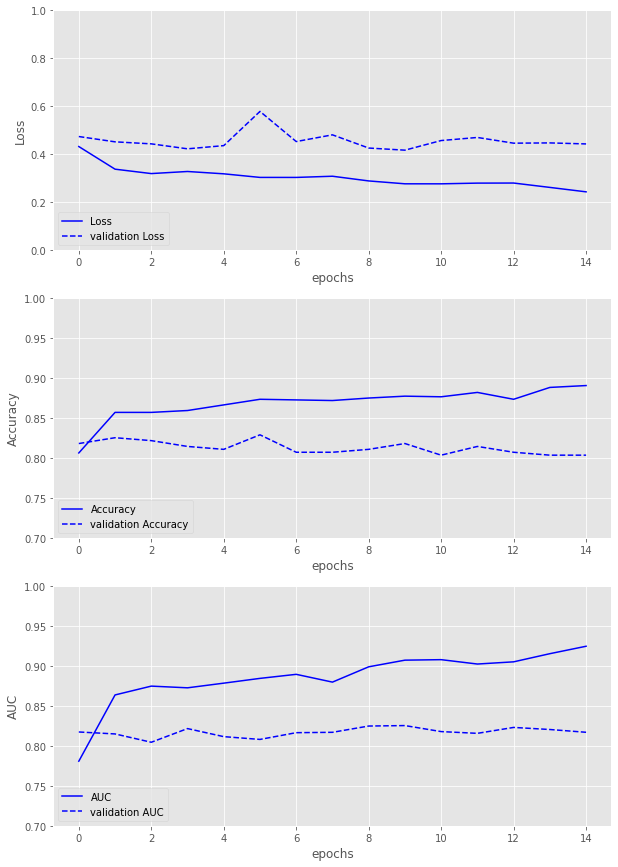

In [ ]:
# plot results
f, ax = plt.subplots(3, 1, figsize=(10, 15))

ax[0].plot(r.history['loss'], label = 'Loss', color = 'b')
ax[0].plot(r.history['val_loss'], label = 'validation Loss', color = 'b', ls= '--')
ax[0].legend(loc="lower left")
ax[0].set_ylim(0.0, 1.0)
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('Loss')

ax[1].plot(r.history['accuracy'], label = 'Accuracy', color = 'b')
ax[1].plot(r.history['val_accuracy'], label = 'validation Accuracy', color = 'b', ls= '--')
ax[1].legend(loc="lower left")
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_ylim(0.7, 1.0)

ax[2].plot(r.history['auc'], label = 'AUC', color = 'b')
ax[2].plot(r.history['val_auc'], label = 'validation AUC', color = 'b', ls= '--')
ax[2].legend(loc="lower left")
ax[2].set_xlabel('epochs')
ax[2].set_ylabel('AUC')
ax[2].set_ylim(0.7, 1.0);

In [ ]:
# Evaluate the model on the test data using `evaluate`

print("Evaluate on test data")
print("---" * 10)

results = model.evaluate(x_tst, y_tst, batch_size=5)

print(' ')
print("Test loss:", results[0])
print("Test accuracy:", results[1])
print("Test AUC:", results[2])
print(' ')


# Compare the total rainy days in all the datasets combined

y_mod_tra = model.predict(x_tra)>0.5
y_mod_val = model.predict(x_val)>0.5
y_mod_tst = model.predict(x_tst)>0.5
count = sum(y_mod_tra) + sum(y_mod_val) + sum(y_mod_tst)

print('Total rainy days:')
print('--' * 10)
print('The model predicted', count[0], 'rainy days.')
print('There were actually', sum(df['Rain']), 'rainy days.')

Evaluate on test data
------------------------------
55/55 [==============================] - 31s 525ms/step - loss: 0.3568 - accuracy: 0.8400 - auc: 0.8605
 
Test loss: 0.35680490732192993
Test accuracy: 0.8399999737739563
Test AUC: 0.8604992628097534
 
Total rainy days:
--------------------
The model predicted 272 rainy days.
There were actually 328.0 rainy days.



               precision    recall  f1-score   support

     No Rain       0.90      0.90      0.90       227
        Rain       0.54      0.54      0.54        48

    accuracy                           0.84       275
   macro avg       0.72      0.72      0.72       275
weighted avg       0.84      0.84      0.84       275



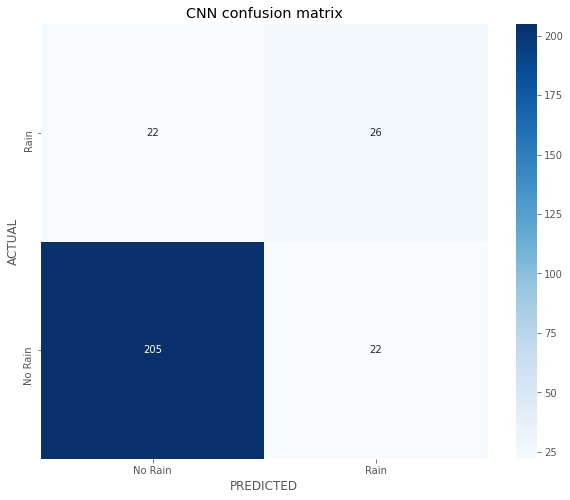

In [ ]:
# confusion matrix, training dataset

conf_matrix = []

labels = ['No Rain', 'Rain']

y_mod = model.predict(x_tst)>0.5  # only the testing dataset

conf_matrix.append(confusion_matrix(y_mod, y_tst))
print('\n', classification_report(y_mod, y_tst, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('CNN confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');

# Incorporating latitude:

The percentage of rainy days in the dataset is 29.79%.
 


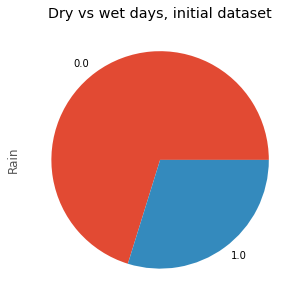

In [ ]:
df['Rain'].value_counts().plot.pie(title='Dry vs wet days, initial dataset', figsize=(5, 5));

per = 100 * np.sum(df['Rain']) / len(df)
print(f'The percentage of rainy days in the dataset is {per:.2f}%.')
print(' ')

One model for feature extraction (conv_model) and then the classifier with latitude also incorporated:

In [ ]:
# feature extraction model

i1 = Input(shape=x_tra[0].shape, name='Input_pixels')

x = Conv2D(8, (3, 3), strides=1, activation='relu', padding='valid', name='Convolutional_A1')(i1)
x = Conv2D(8, (3, 3), strides=1, activation='relu', padding='valid', name='Convolutional_A2')(x)
x = MaxPool2D(name='MaxPool2D_A')(x)  # Max pooling performs better than Average pooling

x = Conv2D(16, (3, 3), strides=1, activation='relu', padding='valid', name='Convolutional_B1')(x)
x = Conv2D(16, (3, 3), strides=1, activation='relu', padding='valid', name='Convolutional_B2')(x)
x = MaxPool2D(name='MaxPool2D_B')(x)

# x = Conv2D(128, (3, 3), strides=1, activation='relu', padding='valid', name='Convolutional_C1')(x)
# x = Conv2D(128, (3, 3), strides=1, activation='relu', padding='valid', name='Convolutional_C2')(x)
# x = MaxPool2D(name='MaxPool2D_C')(x)

x = Flatten(name='Flatten')(x)  # Flatten or Globalpooling

# x = GlobalAveragePooling2D(name='GlobalPooling')(x)

conv_model = Model(i1, x, name='Feature_extraction_model')

# model summary
print('Model summary')
print("---" * 10)
print(conv_model.summary())

Model summary
------------------------------
Model: "Feature_extraction_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input_pixels (InputLayer)    [(None, 32, 32, 3)]       0         
_________________________________________________________________
Convolutional_A1 (Conv2D)    (None, 30, 30, 8)         224       
_________________________________________________________________
Convolutional_A2 (Conv2D)    (None, 28, 28, 8)         584       
_________________________________________________________________
MaxPool2D_A (MaxPooling2D)   (None, 14, 14, 8)         0         
_________________________________________________________________
Convolutional_B1 (Conv2D)    (None, 12, 12, 16)        1168      
_________________________________________________________________
Convolutional_B2 (Conv2D)    (None, 10, 10, 16)        2320      
_______________________________________________________________

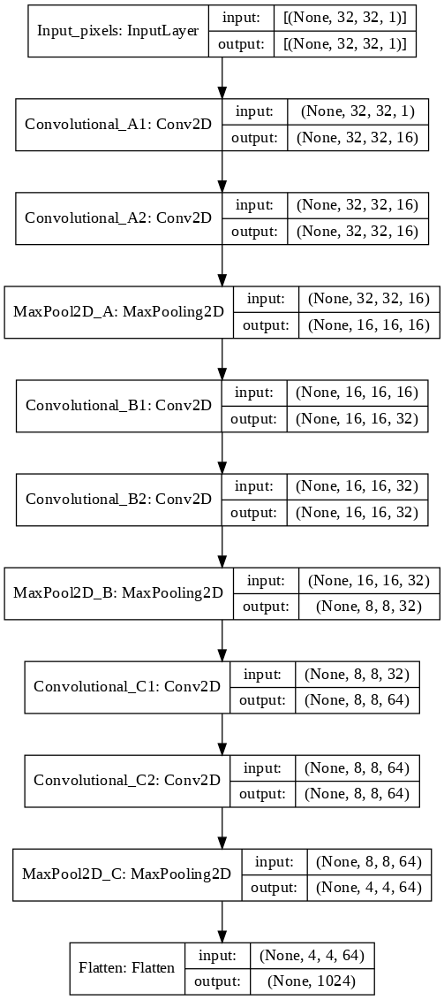

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(conv_model, show_shapes=True, dpi=92)

In [ ]:
# classifier model

i1 = Input(shape=[400], name='Input_features_extraction')
i2 = Input(shape=1, name='Input_latitude')

x = Concatenate(axis=1, name='Merged_inputs')([i1, i2])

# x = Dense(256, activation='relu', name='Hidden_new')(x)
# x = Dropout(0.1, name='Dropout_1')(x)
x = Dense(16, activation='tanh', name='Hidden')(x)

# x = Dropout(0.1, name='Dropout_2')(x)
x = Dense(1, activation='sigmoid', name='Output')(x)

fc_model = Model([i1, i2], x, name='Classifier_model')

# model summary
print('Model summary')
print("---" * 10)
print(fc_model.summary())

Model summary
------------------------------
Model: "Classifier_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_features_extraction (Inpu [(None, 400)]        0                                            
__________________________________________________________________________________________________
Input_latitude (InputLayer)     [(None, 1)]          0                                            
__________________________________________________________________________________________________
Merged_inputs (Concatenate)     (None, 401)          0           Input_features_extraction[0][0]  
                                                                 Input_latitude[0][0]             
__________________________________________________________________________________________________
Hidden (Dense)                  (None,

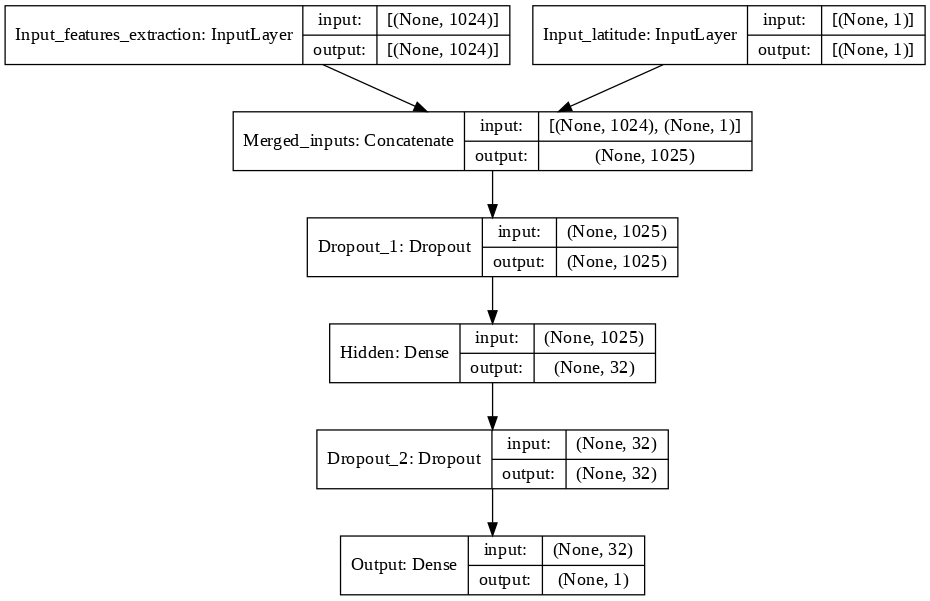

In [ ]:
plot_model(fc_model, show_shapes=True, dpi=92)

In [ ]:
# CNN + latitude: conv_model + classifier

input1 = Input(shape=x_tra[0].shape, name='Input_pixels')
input2 = Input(shape=1, name='Input_latitude')

cnn_output = conv_model( input1 )
output = fc_model( [ cnn_output , input2 ] )

model = Model( [ input1 , input2 ] , output )

# model summary
print('Model summary')
print("---" * 10)
print(model.summary())

Model summary
------------------------------
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_pixels (InputLayer)       [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
Feature_extraction_model (Funct (None, 400)          4296        Input_pixels[0][0]               
__________________________________________________________________________________________________
Input_latitude (InputLayer)     [(None, 1)]          0                                            
__________________________________________________________________________________________________
Classifier_model (Functional)   (None, 1)            6449        Feature_extraction_model[0][0]   
                                                 

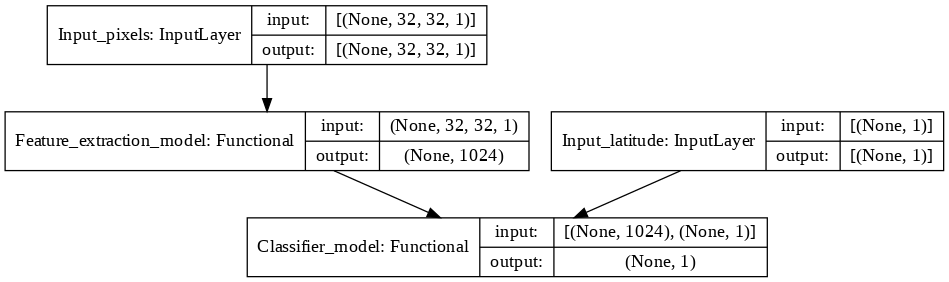

In [ ]:
plot_model(model, show_shapes=True, dpi=92)

In [ ]:
# Calculate the weights for each class so that we can balance the data
w = class_weight.compute_class_weight('balanced',
                                       np.unique(y_tra),
                                       y_tra
                                     )

weights = {0: w[0], 1: w[1]}

print('weights for 0 and 1:', w)

# define the metrics

metrics = ['accuracy', 
           tf.keras.metrics.Precision(), 
           tf.keras.metrics.Recall(),
          ]

# compile the model
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=metrics)

# fit the model and save the trajectories of loss and accuracy for training and test dataset
r_CNN = model.fit([ x_tra, x_tra_latitude ], y_tra, verbose = 1, validation_data=([ x_val, x_val_latitude ], y_val), epochs=6, batch_size=256)  # , class_weight=weights)

weights for 0 and 1: [0.7124884  1.67653484]
Epoch 1/6
174/174 [==============================] - 38s 208ms/step - loss: 0.5431 - accuracy: 0.7284 - precision: 0.5067 - recall: 0.3283 - val_loss: 0.4659 - val_accuracy: 0.7750 - val_precision: 0.6377 - val_recall: 0.5660
Epoch 2/6
174/174 [==============================] - 35s 203ms/step - loss: 0.4750 - accuracy: 0.7707 - precision: 0.6416 - recall: 0.5254 - val_loss: 0.4605 - val_accuracy: 0.7796 - val_precision: 0.6697 - val_recall: 0.5122
Epoch 3/6
174/174 [==============================] - 35s 204ms/step - loss: 0.4739 - accuracy: 0.7729 - precision: 0.6539 - recall: 0.5040 - val_loss: 0.4595 - val_accuracy: 0.7796 - val_precision: 0.6752 - val_recall: 0.5003
Epoch 4/6
174/174 [==============================] - 38s 219ms/step - loss: 0.4670 - accuracy: 0.7776 - precision: 0.6644 - recall: 0.5163 - val_loss: 0.4577 - val_accuracy: 0.7786 - val_precision: 0.6616 - val_recall: 0.5247
Epoch 5/6
174/174 [==============================] 

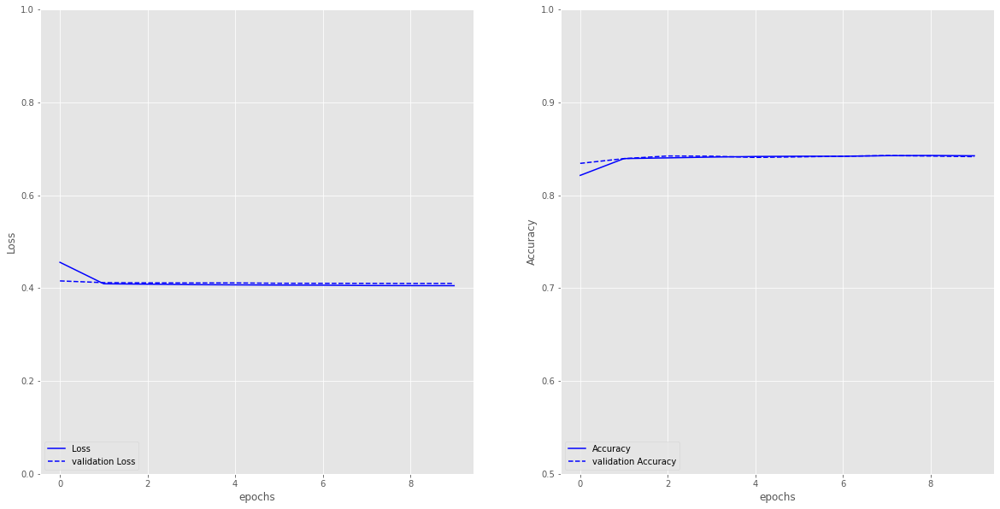

In [ ]:
# plot results
f, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].plot(r_CNN.history['loss'], label = 'Loss', color = 'b')
ax[0].plot(r_CNN.history['val_loss'], label = 'validation Loss', color = 'b', ls= '--')
ax[0].legend(loc="lower left")
ax[0].set_ylim(0.0, 1.0)
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('Loss')

ax[1].plot(r_CNN.history['accuracy'], label = 'Accuracy', color = 'b')
ax[1].plot(r_CNN.history['val_accuracy'], label = 'validation Accuracy', color = 'b', ls= '--')
ax[1].legend(loc="lower left")
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_ylim(0.5, 1.0);

In [ ]:
# Evaluate the model on the test data using `evaluate`

print("Evaluate on test data")
print("---" * 10)

results = model.evaluate([ x_tst, x_tst_latitude ], y_tst, batch_size=16)

print(' ')
print("Test loss:", results[0])
print("Test accuracy:", results[1])
print("Test AUC:", results[2])
print(' ')


# Compare the total rainy days in all the datasets combined

# y_mod_tra = model.predict([ x_tra, x_tra_latitude ])>0.5
# y_mod_val = model.predict([ x_val, x_val_latitude ])>0.5
y_mod_tst = sum(model.predict([ x_tst, x_tst_latitude ])>0.5)
# count = sum(y_mod_tra) + sum(y_mod_val) + sum(y_mod_tst)

print('Total rainy days in the TRAINING dataset:')
print('--' * 10)
print('The model predicted', y_mod_tst[0], 'rainy days in the TRAINING dataset.')
print('There were actually', sum(y_tst), 'rainy days in the TRAINING dataset.')

Evaluate on test data
------------------------------
696/696 [==============================] - 5s 7ms/step - loss: 0.4575 - accuracy: 0.7785 - precision: 0.6705 - recall: 0.4980
 
Test loss: 0.4574835002422333
Test accuracy: 0.7784867286682129
Test AUC: 0.6704730987548828
 
Total rainy days in the TRAINING dataset:
--------------------
The model predicted 2452 rainy days in the TRAINING dataset.
There were actually 3301.0 rainy days in the TRAINING dataset.



               precision    recall  f1-score   support

     No Rain       0.81      0.90      0.85      7827
        Rain       0.67      0.50      0.57      3301

    accuracy                           0.78     11128
   macro avg       0.74      0.70      0.71     11128
weighted avg       0.77      0.78      0.77     11128



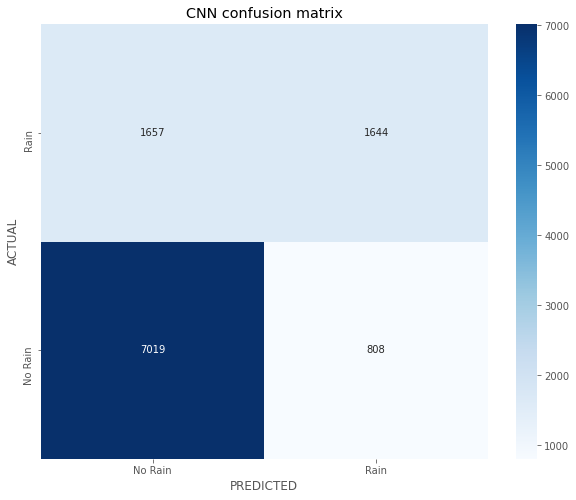

In [ ]:
# confusion matrix, training dataset

conf_matrix = []

# Precision quantifies the number of positive class predictions that actually belong to the positive class.
# Recall quantifies the number of positive class predictions made out of all positive examples in the dataset.
# F-Measure provides a single score that balances both the concerns of precision and recall in one number.

labels = ['No Rain', 'Rain']

y_mod = model.predict([ x_tst, x_tst_latitude ])>0.5  # only the testing dataset

conf_matrix.append(confusion_matrix(y_tst, y_mod))
print('\n', classification_report(y_tst, y_mod, target_names = labels))  

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_matrix[0], annot=True, fmt=".0f", ax=ax, cmap = 'Blues')

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
ax.set_ylim(0, 2)  # needed for text allignment

plt.title('CNN confusion matrix')
plt.xlabel('PREDICTED')
plt.ylabel('ACTUAL')

plt.show()
print('\n');